Ce projet est réalisé par Taha HABIB et Mohamed Sadok BOUZID

# a ne pas oublier : Description des différentes variables dans le readme

# enlever selected items

# 0. Installations et bibliothèques

## Installations

In [1]:
%pip install lxml

!pip install python-dotenv
!pip install spotipy

!pip install tqdm

Note: you may need to restart the kernel to use updated packages.


## Importation des bibliothèques

In [139]:
# Web scraping
import bs4
import requests
import pickle

# Utilisation du fichier .env
from dotenv import load_dotenv
import os

# Spotify api
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials

# Progress bar
from tqdm.notebook import tqdm

# Manipulation des données
import pandas as pd
import numpy as np
import ast  # Conversion de chaînes de caractères en listes

# Visualisation et analyse des données
import seaborn as sns
import matplotlib.pyplot as plt
import math
from scipy.stats import gaussian_kde

# Préparation des données pour la modélisation
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split

# Modélisation
from sklearn.linear_model import Lasso
from sklearn.linear_model import LassoCV
from sklearn.linear_model import Ridge
from sklearn.linear_model import RidgeCV
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR

# Evaluation des modèles
from sklearn.metrics import mean_squared_error, r2_score

# I. Récupération des données

## I. 1. WebScrapping

Nous commençons par extraire les musiques et leurs artistes entre 2010 et 2023 du site 'https://www.songfacts.com/browse/years/' en bouclant sur les différentes pages 'https://www.songfacts.com/browse/years/{year}'. On les enregistre dans un dictionnaire qu'on appelle music_dict.

In [20]:
headers = {
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/58.0.3029.110 Safari/537.3'
}
music_dict = {}
for year in range(2010, 2024):
    url = f'https://www.songfacts.com/browse/years/{year}'
    html_response = requests.get(url, headers=headers)
    html_text = html_response.text 
    soup = bs4.BeautifulSoup(html_text,'lxml')
    page_numbers = soup.find("div", class_="pagination-result-info visible-md visible-lg visible-sm")
    #print(page_numbers.text)
    sentence = page_numbers.text.split()
    #print(sentence)
    page_number = sentence[-1]
    page_number = int(page_number)
    #print(page_number)
    for page_num in range(1, page_number):
        if page_num ==1 : 
            url = f'https://www.songfacts.com/browse/years/{year}'
        else :
            url = f'https://www.songfacts.com/browse/years/{year}/page{page_num}'
        html_response = requests.get(url, headers=headers)
        html_text = html_response.text 
        soup = bs4.BeautifulSoup(html_text,'lxml')
        music_elements = soup.select('body > div:nth-child(8) > div > div > div > ul > li')
        for music_element in music_elements: 
            music_name = music_element.text
            #print(music_name)
            element = music_name.split(' - ')
            if len(element)==2:
                #print(element)
                song, singer = element
                music_dict[song] = singer
print(music_dict)
print(len(music_dict))

FeatureNotFound: Couldn't find a tree builder with the features you requested: lxml. Do you need to install a parser library?

Nous trouvons ainsi 22925 musiques. 

In [4]:
music_dict['3D']

'Jungkook'

En scrappant les musiques du site web, nous apercevons plutart que l'api spotify ne reconnait pas les titres/artiste dont le nom contient des apostrophes, de plus que certaines nommations sont différentes entre le site web et spotify. 

Par exemple, pour le titre '3D' de l'artiste 'JungKook', nous trouvons que Spotify l'appelle 'Jung Kook'. Donc il fallait chercher chaque titre à part pour trouver comment spotify a decidé de l'appeler. 


Nous avons commencé au début d'essayer de les corriger à la main ( comme le montre le code ci-dessous) mais vu la nature du problème, ce n'est pas automatisable. Par la suite, nous avons décider d'ignorer les ids non trouvés par l'API spotify.

In [5]:
music_dict['3D'] = 'Jung kook'
music_dict['Stuck'] = 'Thirty Seconds to Mars'
music_dict['Get Up Kid'] = 'Thirty Seconds to Mars'
music_dict['Trustfall'] = 'P!nk'
music_dict['Standing Next To You'] = 'Jung kook'
music_dict['Seven'] = 'Jung kook'
music_dict.pop("She'll Let Herself Out")
music_dict['Shell Let Herself Out'] = 'Maia Sharp'
music_dict['Beso'] = 'Rosalia, Rauw Alejandro'
music_dict['Que Onda'] = 'Calle 24, Chino Pacas, Fuerza Regida'
music_dict['Sad B!tch '] = 'Anne-Marie'
music_dict["Im Not Pretty"] = 'Megan Moroney'
music_dict.pop("Can't Break Up Now") 
music_dict['Cant Break Up Now'] = 'Old Dominion, Megan Moroney'
music_dict.pop("Can't Tame Her")
music_dict['Cant Tame Her'] = 'Zara Larsson'
music_dict.pop('Can\'t Outrun The Truth')
music_dict['Cant Outrun The Truth'] ='Pete Townshend'
music_dict.pop('All My Sh-t Is In My Car')
music_dict['All My Shit Is In My Car'] = 'JP Saxe'
music_dict['Vultures'] = '¥$, Kanye West, Ty Dolla $ign, Bump J, Lil Durk'
music_dict.pop("Don't Forget Me")
music_dict['Dont Forget Me'] ='Dermot Kennedy'
music_dict.pop("Don't Say Love")
music_dict["Dont Say Love"] = 'Leigh-Anne'
music_dict.pop("Haven't You Ever Been In Love Before?")
music_dict["Havent You Ever Been In Love Before?"] = 'Lewis Capaldi'
music_dict.pop("Hum's Liquor")
music_dict.pop("Can't Play Myself (A Tribute To Amy)")
music_dict['Cant Play Myself (A Tribute To Amy)'] = 'Skepta'

music_dict.pop("I'll Be Holding On")
music_dict['Ill Be Holding On']='Morgan James'
music_dict.pop("I'm Not Here To Make Friends")
music_dict['Im Not Here To Make Friends']='Sam Smith'
music_dict.pop("I'm Not Pretty")
music_dict["Im Not Pretty"]='Megan Moroney'
music_dict.pop("J'adore")
music_dict['Jadore']='Strandz'
music_dict["Money On The Dash"]='Whethan,elley, Duhé'
music_dict.pop("Sad Bitch")
music_dict['Sad B!tch']='Anne-Marie'
music_dict.pop("DIwhy")
music_dict.pop("Money On The Dash")


'Whethan,elley,\xa0Duhé'

Afin de ne pas lancer à chaque fois le code de scrapping, nous décidons d'enregistrer le dictionnaire music_dict sous forme de '.pkl'.

In [7]:
with open('music_dict.pkl', 'wb') as file:
    pickle.dump(music_dict, file)

Ainsi à chaque utilisation du code, nous ne lançons que la cellule ci-dessous

In [5]:
with open('music_dict.pkl', 'rb') as file:
        music_dict = pickle.load(file)
print(music_dict)
print(len(music_dict))

{'(Ha Ha) Slow Down': 'Fat Joe', "(I Can't Make It) Another Day": 'Michael Jackson', '(I Like) The Way You Love Me': 'Michael Jackson', "(It's Not War) Just the End of Love": 'Manic Street Preachers', '...And the World Laughs With You': 'Flying Lotus', '1+1': 'Beyoncé', '1,000 Faces': 'Randy Montana', '10 Seconds': 'Jazmine Sullivan', '100 Years From Now': 'Karen Elson', '1000 Years': 'The Coral', '187': "Lil' Boosie", '1979': 'Good Charlotte', '1983': 'Neon Trees', '2 Fat Ladies': 'Paul Weller', '2 Sides of Me': 'Hinder', '2012': 'The Word Alive', "2012 (It Ain't the End)": 'Jay Sean', '21@12': 'Hot Hot Heat', '25 to Life': 'Eminem', '30 Thousand 100 Million': 'Soulja Boy', '4 June 1989': 'Mary Chapin Carpenter', '4th of July (Fireworks)': 'Kelis', '6 Foot 7 Foot': 'Lil Wayne', '7 Day Binge': '7dayBinge', "7&3 is the Striker's Name": 'Paul Weller', '7x70': 'Chris August', '81': 'Joanna Newsom', '@!#?@! (swear words)': 'Motion City Soundtrack', 'A Billion Balconies Facing the Sun': 'Ma

## I. 2. Utilisation de l'API Spotify

Nous utilisons l'API Spotify et plus spécialement la Web API. Pour cela nous avons dû créer une application sur le site Spotify for Developers, pour ainsi avoir un `Client ID` et un `Client secret` propre à notre application, qui nous permettront de nous authentifier et d'accéder aux données de Spotify. 

Nous les stockons dans un fichier .env dont nous faisons l'appel grâce à la fonction suivante.


En pratique, nous avons stocké plusieurs identifiants, nous verrons pourquoi par la suite.
Nous créons ainsi une fonction `load_credentials(num)` qui prend en argument un numéro. Cette fonction utilise ce numéro pour récupérer les identifiants correspondants 'Client ID' et 'Client Secret' depuis notre fichier `.env`. Ces identifiants sont ensuite retournés par la fonction, nous permettant d'utiliser différents jeux d'identifiants en fonction du numéro que nous passons à la fonction.

In [6]:
def load_credentials(num):
    load_dotenv()

    client_secret = os.getenv(f"CLIENT_SECRET{num}")
    client_id = os.getenv(f"CLIENT_ID{num}")

    return client_secret, client_id

In [7]:
client_secret, client_id = load_credentials(1)
print(client_secret)
print(client_id)

18e61a3505fc4055a01c5098b7bd6663
cdfb4eebae314c088bcdcaf2795655fa


Dans ce bloc de code, nous initialisons l'authentification avec l'API Spotify. Nous créons un objet `spotifyObject` qui sera utilisé pour interagir avec l'API.

In [8]:
client_credentials_manager = SpotifyClientCredentials(client_id=client_id, client_secret=client_secret)
spotifyObject = spotipy.Spotify(client_credentials_manager = client_credentials_manager)

En utilisant le dictionnaire `music_dict`, nous recherchons chaque musique sur l'API Spotify en utilisant son nom et celui de l'artiste correspondant. Nous stockons ensuite l'ID de la musique, son nom, le nom de l'artiste et l'année de sortie dans des listes séparées.

Au delà de 17000 requêtes à peu prés l'API ne marche plus, c'est pour cela que nous avons décidé d'utiliser deux client_id et client_secret pour récupérer les différents ids. Pour des raisons de simplicité et pour ne pas avoir des erreurs lors du lancement du code nous n'allons détailler que l'extraction des 10000 premières musiques.

In [5]:
# Initialisation des listes pour stocker les données des musiques
track_names = []
artist_names = []
track_ids = []
release_years = []

selected_items = list(music_dict.items())

# Boucle à travers les éléments du dictionnaire
selected_items = list(music_dict.items())[:10000]
for track_name, artist_name in tqdm(selected_items):
    # Recherche de la musique sur Spotify
    results = spotifyObject.search(q=f'artist:{artist_name} track:{track_name}', type='track')

    # Vérifie si la recherche a renvoyé des résultats sinon on passe à la musique suivante
    if results['tracks']['items']:
        track_info = results['tracks']['items'][0]
        
        # Vérifie si track_info est None, si c'est le cas, passe à l'itération suivante
        if track_info is None:
            continue
        
        # Vérifie si les clés 'id' et 'album' existent dans le dictionnaire info_de_la_musique
        if 'id' in track_info and 'album' in track_info and 'release_date' in track_info['album']:
            track_id = track_info['id']
            release_date = track_info['album']['release_date']
            release_year = release_date.split('-')[0]  # Extrait l'année de la date de sortie
                        
            # Ajoute les données aux listes respectives
            track_names.append(track_name)
            artist_names.append(artist_name)
            track_ids.append(track_id)
            release_years.append(release_year)

  0%|          | 0/10000 [00:00<?, ?it/s]

On crée un dataset à partir des listes remplies en haut. Le dataset contient ainsi 4 colonnes : `Track Name`, `Artist Name`, `Track ID` et `Release Year`. On le stocke aussi pour ne pas relancer l'étape d'extraction à chaque fois.

In [50]:
data_0_20000 = {
    'Track Name': track_names,
    'Artist Name': artist_names,
    'Track ID': track_ids,
    'Release Year': release_years
}

data_0_20000 = pd.DataFrame(data_0_20000)
data_0_20000.to_csv('music_data_0_20000.csv', index=False)

Afin d'extraire les caractéristiques audio des différentes musiques, il nous faut les IDs des différentes musiques. C'est pour cela, nous récupérons les IDs des musiques de la base de données que nous venons d'obtenir et nous les stockons dans la liste `track_ids`

In [21]:
data_0_20000 = pd.read_csv('music_data_00_17000.csv')

data_0_20000 = data_0_20000.dropna(subset=['Track ID'])

track_ids = data_0_20000['Track ID'].tolist()

Vu qu'on utilise track_ids par la suite et afin d'éviter tout problème de merge et de manipulation nous avons décidé d'enlever les IDs nuls, dès maintenant.

Dans le code qui suit, nous récupérons les caractéristiques audio de chaque musique à partir de son ID Spotify. Comme la méthode `audio_features` de l'API Spotify a une limite de 100 ID par requête, nous divisons notre liste d'ID de musiques en sous-listes de 100 ID ou moins. Ensuite, nous bouclons sur ces sous-listes pour récupérer les caractéristiques audio de toutes les musiques. Les caractéristiques récupérées sont ensuite ajoutées à la liste `features_list`.

In [22]:
n = len(track_ids)
num_iter = n//100

track_id_part = [track_ids[i*100: (i+1)*100] for i in range(num_iter)]
track_id_part.append(track_ids[num_iter*100:])

features_list = []
for tr in track_id_part:
    features = spotifyObject.audio_features(tr)
    features_list.extend(features)

In [23]:
print(len(features_list))
print(features_list[:10])

15483
[{'danceability': 0.307, 'energy': 0.879, 'key': 9, 'loudness': -5.557, 'mode': 1, 'speechiness': 0.528, 'acousticness': 0.123, 'instrumentalness': 0, 'liveness': 0.0621, 'valence': 0.407, 'tempo': 190.393, 'type': 'audio_features', 'id': '2GSvDs1qdhcPpfawycouWy', 'uri': 'spotify:track:2GSvDs1qdhcPpfawycouWy', 'track_href': 'https://api.spotify.com/v1/tracks/2GSvDs1qdhcPpfawycouWy', 'analysis_url': 'https://api.spotify.com/v1/audio-analysis/2GSvDs1qdhcPpfawycouWy', 'duration_ms': 205000, 'time_signature': 4}, {'danceability': 0.682, 'energy': 0.837, 'key': 2, 'loudness': -4.654, 'mode': 1, 'speechiness': 0.116, 'acousticness': 0.0339, 'instrumentalness': 7.23e-06, 'liveness': 0.0471, 'valence': 0.886, 'tempo': 90.019, 'type': 'audio_features', 'id': '5OgTq4ExF13EdcLD6PSYuN', 'uri': 'spotify:track:5OgTq4ExF13EdcLD6PSYuN', 'track_href': 'https://api.spotify.com/v1/tracks/5OgTq4ExF13EdcLD6PSYuN', 'analysis_url': 'https://api.spotify.com/v1/audio-analysis/5OgTq4ExF13EdcLD6PSYuN', 'du

In [24]:
# Supprime les éléments None de la liste afin de la transformer en dataset
features_list = [f for f in features_list if f is not None]
features_df = pd.DataFrame(data=features_list, columns=features_list[0].keys())

In [25]:
features_df.head()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,type,id,uri,track_href,analysis_url,duration_ms,time_signature
0,0.307,0.879,9,-5.557,1,0.5280,0.123000,0.000000,0.0621,0.407,190.393,audio_features,2GSvDs1qdhcPpfawycouWy,spotify:track:2GSvDs1qdhcPpfawycouWy,https://api.spotify.com/v1/tracks/2GSvDs1qdhcP...,https://api.spotify.com/v1/audio-analysis/2GSv...,205000,4
1,0.682,0.837,2,-4.654,1,0.1160,0.033900,0.000007,0.0471,0.886,90.019,audio_features,5OgTq4ExF13EdcLD6PSYuN,spotify:track:5OgTq4ExF13EdcLD6PSYuN,https://api.spotify.com/v1/tracks/5OgTq4ExF13E...,https://api.spotify.com/v1/audio-analysis/5OgT...,234413,4
2,0.626,0.662,0,-4.272,1,0.0282,0.307000,0.000016,0.2410,0.511,94.993,audio_features,3VDJf1JQWl9m3H1JgdhUNj,spotify:track:3VDJf1JQWl9m3H1JgdhUNj,https://api.spotify.com/v1/tracks/3VDJf1JQWl9m...,https://api.spotify.com/v1/audio-analysis/3VDJ...,273800,4
3,0.538,0.886,5,-5.310,1,0.0309,0.000078,0.025400,0.2100,0.565,138.993,audio_features,6s57NVutjlmejmjTJr3Sj0,spotify:track:6s57NVutjlmejmjTJr3Sj0,https://api.spotify.com/v1/tracks/6s57NVutjlme...,https://api.spotify.com/v1/audio-analysis/6s57...,208053,4
4,0.637,0.717,8,-7.635,0,0.1430,0.185000,0.497000,0.1410,0.541,80.926,audio_features,5STqmIsYNIaupSUZrcDgaZ,spotify:track:5STqmIsYNIaupSUZrcDgaZ,https://api.spotify.com/v1/tracks/5STqmIsYNIau...,https://api.spotify.com/v1/audio-analysis/5STq...,175040,4


Nous stockons le jeu de données des caractéristiques `features_df` pour éviter de recommencer depuis le début en cas d'erreur ultérieure.

In [26]:
features_df.to_csv('features_data_0_20000.csv', index=False)

In [27]:
features_df = pd.read_csv('features_data_0_20000.csv')

On fusionne maintenant les 2 dataset `features_df` et `data_0_20000`

In [29]:
# Fusionner les deux DataFrames sur la colonne 'Track ID'
merged_df = pd.merge(data_0_20000, features_df, how='left', left_on='Track ID', right_on='id')

# Supprimer les lignes où une caractéristique est None
merged_df = merged_df.dropna(subset=features_df.columns[features_df.isna().any()].tolist())

In [30]:
merged_df.head()

,Track Name,Artist Name,Track ID,Release Year,danceability,energy,key,loudness,mode,speechiness,...,liveness,valence,tempo,type,id,uri,track_href,analysis_url,duration_ms,time_signature
0,(Ha Ha) Slow Down,Fat Joe,2GSvDs1qdhcPpfawycouWy,2010.0,0.307,0.879,9.0,-5.557,1.0,0.5280,...,0.0621,0.407,190.393,audio_features,2GSvDs1qdhcPpfawycouWy,spotify:track:2GSvDs1qdhcPpfawycouWy,https://api.spotify.com/v1/tracks/2GSvDs1qdhcP...,https://api.spotify.com/v1/audio-analysis/2GSv...,205000.0,4.0
1,(I Can't Make It) Another Day,Michael Jackson,5OgTq4ExF13EdcLD6PSYuN,2010.0,0.682,0.837,2.0,-4.654,1.0,0.1160,...,0.0471,0.886,90.019,audio_features,5OgTq4ExF13EdcLD6PSYuN,spotify:track:5OgTq4ExF13EdcLD6PSYuN,https://api.spotify.com/v1/tracks/5OgTq4ExF13E...,https://api.spotify.com/v1/audio-analysis/5OgT...,234413.0,4.0
2,(I Like) The Way You Love Me,Michael Jackson,3VDJf1JQWl9m3H1JgdhUNj,2010.0,0.626,0.662,0.0,-4.272,1.0,0.0282,...,0.2410,0.511,94.993,audio_features,3VDJf1JQWl9m3H1JgdhUNj,spotify:track:3VDJf1JQWl9m3H1JgdhUNj,https://api.spotify.com/v1/tracks/3VDJf1JQWl9m...,https://api.spotify.com/v1/audio-analysis/3VDJ...,273800.0,4.0
3,(It's Not War) Just the End of Love,Manic Street Preachers,6s57NVutjlmejmjTJr3Sj0,2010.0,0.538,0.886,5.0,-5.310,1.0,0.0309,...,0.2100,0.565,138.993,audio_features,6s57NVutjlmejmjTJr3Sj0,spotify:track:6s57NVutjlmejmjTJr3Sj0,https://api.spotify.com/v1/tracks/6s57NVutjlme...,https://api.spotify.com/v1/audio-analysis/6s57...,208053.0,4.0
4,...And the World Laughs With You,Flying Lotus,5STqmIsYNIaupSUZrcDgaZ,2010.0,0.637,0.717,8.0,-7.635,0.0,0.1430,...,0.1410,0.541,80.926,audio_features,5STqmIsYNIaupSUZrcDgaZ,spotify:track:5STqmIsYNIaupSUZrcDgaZ,https://api.spotify.com/v1/tracks/5STqmIsYNIau...,https://api.spotify.com/v1/audio-analysis/5STq...,175040.0,4.0


Nous stockons cette base de données aussi 

In [31]:
merged_df.to_csv('final_dataset_0_20000.csv', index=False)

In [32]:
final_dataset = pd.read_csv('final_dataset_0_20000.csv')

Maintenant, il ne nous manque que la variable d'intérêt la `Popularité`.
Avant de commencer l'extraction de la popularité, regardons si les colonnes de notre base de données sont bien homogènes en terme de type.

In [33]:
print(final_dataset.dtypes)

Track Name           object
Artist Name          object
Track ID             object
Release Year        float64
danceability        float64
energy              float64
key                 float64
loudness            float64
mode                float64
speechiness         float64
acousticness        float64
instrumentalness    float64
liveness            float64
valence             float64
tempo               float64
type                 object
id                   object
uri                  object
track_href           object
analysis_url         object
duration_ms         float64
time_signature      float64
dtype: object


Regardons de plus près les types de chaque colonnes

In [34]:
def print_type_counts(df):
    type_counts_per_column = {}
    dominant_types_per_column = {}

    for column in df.columns:
        type_counts = df[column].apply(type).value_counts()
        type_counts_per_column[column] = type_counts
        dominant_types_per_column[column] = type_counts.index[0]

    for column, counts in type_counts_per_column.items():
        print(f"Column: {column}")
        print(counts)
        print("------------------")
    
    return dominant_types_per_column

In [35]:
dominant_types = print_type_counts(final_dataset)

Column: Track Name
<class 'str'>      15544
<class 'float'>        1
Name: Track Name, dtype: int64
------------------
Column: Artist Name
<class 'str'>    15545
Name: Artist Name, dtype: int64
------------------
Column: Track ID
<class 'str'>    15545
Name: Track ID, dtype: int64
------------------
Column: Release Year
<class 'float'>    15545
Name: Release Year, dtype: int64
------------------
Column: danceability
<class 'float'>    15545
Name: danceability, dtype: int64
------------------
Column: energy
<class 'float'>    15545
Name: energy, dtype: int64
------------------
Column: key
<class 'float'>    15545
Name: key, dtype: int64
------------------
Column: loudness
<class 'float'>    15545
Name: loudness, dtype: int64
------------------
Column: mode
<class 'float'>    15545
Name: mode, dtype: int64
------------------
Column: speechiness
<class 'float'>    15545
Name: speechiness, dtype: int64
------------------
Column: acousticness
<class 'float'>    15545
Name: acousticness, dty

On peut clairement voir qu'il y a quelques éléments qui ont dû glisser de type différent que le type prédomiannt de la colonne. On va essayer de le corriger maintenant car nous utiliserons par la suite les IDs pour extraire la popularité.

In [36]:
final_dataset_dropped = final_dataset.copy()
for column in final_dataset.columns:
    # Pour chaque colonne, ne garder que les lignes où le type de la valeur correspond au type dominant de la colonne
    final_dataset_dropped = final_dataset_dropped[final_dataset_dropped[column].apply(lambda x: isinstance(x, dominant_types[column]))]

# Après l'application du filtre, afficher le nombre de chaque type de données
print_type_counts(final_dataset_dropped)

Column: Track Name
<class 'str'>    15544
Name: Track Name, dtype: int64
------------------
Column: Artist Name
<class 'str'>    15544
Name: Artist Name, dtype: int64
------------------
Column: Track ID
<class 'str'>    15544
Name: Track ID, dtype: int64
------------------
Column: Release Year
<class 'float'>    15544
Name: Release Year, dtype: int64
------------------
Column: danceability
<class 'float'>    15544
Name: danceability, dtype: int64
------------------
Column: energy
<class 'float'>    15544
Name: energy, dtype: int64
------------------
Column: key
<class 'float'>    15544
Name: key, dtype: int64
------------------
Column: loudness
<class 'float'>    15544
Name: loudness, dtype: int64
------------------
Column: mode
<class 'float'>    15544
Name: mode, dtype: int64
------------------
Column: speechiness
<class 'float'>    15544
Name: speechiness, dtype: int64
------------------
Column: acousticness
<class 'float'>    15544
Name: acousticness, dtype: int64
-----------------

{'Track Name': str,
 'Artist Name': str,
 'Track ID': str,
 'Release Year': float,
 'danceability': float,
 'energy': float,
 'key': float,
 'loudness': float,
 'mode': float,
 'speechiness': float,
 'acousticness': float,
 'instrumentalness': float,
 'liveness': float,
 'valence': float,
 'tempo': float,
 'type': str,
 'id': str,
 'uri': str,
 'track_href': str,
 'analysis_url': str,
 'duration_ms': float,
 'time_signature': float}

In [37]:
print(len(final_dataset_dropped))

15544


La nouvelle base de données est de 15544 lignes

Nous vérifions si on a des valeurs Nan 

In [38]:
rows_with_nan = final_dataset_dropped[final_dataset_dropped['Track ID'].isna()]
print(rows_with_nan)

Empty DataFrame
Columns: [Track Name, Artist Name, Track ID, Release Year, danceability, energy, key, loudness, mode, speechiness, acousticness, instrumentalness, liveness, valence, tempo, type, id, uri, track_href, analysis_url, duration_ms, time_signature]
Index: []

[0 rows x 22 columns]


In [39]:
track_ids = final_dataset_dropped['Track ID'].tolist()

Lors de l'extraction des popularités avec l'API spotify, nous avons rencontré quelques difficultés. En effet, hormis le nombre limité de requêtes que nous offre l'API spotify par ID Client et Client Secret, le token utilisé pour chaque client n'est pas reintialisé après chaque appel. Ce qui fait que nous avons dû supprimer à le fichier .cache après chaque appel. 
De là l'automatisation du code en utilisant une boucle ne marche pas.

Pour cela nous avons divisé l'extraction en plusieurs parties. Nous divisons d'abord les IDs en groupes de 2000 et nous appelons ainsi l'API pour chacun de ces groupes. 
Pour des raisons de simplicité et de reproductibilité du code, nous n'allons détailler ci-dessous que l'exemple d'extraction de la popularité pour le premier groupe.

In [40]:
load_credentials(1)
client_credentials_manager = SpotifyClientCredentials(client_id=client_id, client_secret=client_secret)
spotifyObject = spotipy.Spotify(client_credentials_manager = client_credentials_manager)

In [22]:
for i in range(len(track_ids)):
popularity0_2000 = []
for id in tqdm(track_ids[:2000]):
    if(id == None):
        popularity0_2000.append(None)
    else : 
        track_info = spotifyObject.track(id)
        popularity0_2000.append(track_info['popularity'])

  0%|          | 0/2000 [00:00<?, ?it/s]

In [ ]:
# Convert the list to a Pandas Series
series = pd.Series(popularity0_2000, name='popularity0_2000')

# Save the Series to a CSV file
series.to_csv('popularity0_2000.csv', index=False)

In [41]:
loaded_series = pd.read_csv('popularity0_7500.csv')


popularity0_2000 = loaded_series['popularity0_7500'].tolist()

print(popularity0_2000)
print(len(popularity0_2000))

[35, 38, 47, 35, 38, 61, 15, 52, 10, 17, 43, 51, 42, 35, 58, 10, 63, 21, 10, 26, 74, 28, 9, 15, 16, 31, 1, 23, 61, 38, 22, 15, 48, 21, 3, 70, 58, 9, 59, 31, 5, 18, 33, 47, 51, 57, 35, 32, 58, 36, 23, 78, 25, 42, 6, 19, 60, 48, 53, 59, 63, 71, 0, 79, 51, 74, 59, 29, 37, 46, 81, 45, 68, 57, 24, 17, 25, 3, 67, 14, 27, 33, 16, 37, 28, 40, 36, 12, 65, 46, 6, 15, 69, 19, 29, 24, 65, 64, 28, 40, 49, 27, 19, 22, 9, 54, 30, 41, 20, 38, 8, 37, 6, 65, 24, 32, 14, 7, 44, 7, 8, 66, 52, 3, 11, 72, 33, 41, 42, 14, 24, 46, 58, 58, 64, 29, 35, 61, 33, 17, 83, 74, 36, 61, 37, 4, 13, 46, 52, 12, 20, 44, 18, 34, 47, 28, 12, 63, 51, 56, 57, 5, 53, 64, 35, 33, 60, 46, 43, 0, 23, 45, 47, 16, 72, 40, 39, 33, 17, 33, 41, 79, 34, 4, 33, 32, 13, 42, 35, 44, 39, 45, 19, 23, 6, 41, 54, 77, 32, 22, 8, 0, 17, 22, 69, 65, 48, 48, 20, 48, 40, 15, 2, 55, 14, 51, 64, 48, 37, 43, 49, 33, 19, 36, 10, 56, 24, 66, 41, 57, 54, 33, 49, 52, 55, 38, 21, 60, 28, 36, 36, 26, 14, 27, 45, 0, 40, 0, 11, 50, 30, 9, 0, 36, 33, 43, 0, 

Nous répétons ces étapes jusqu'à l'extraction de toutes les popularités de la base de données, et nous fusionnons toutes les listes de popularité pour finalement obtenir toutes les popularités que nous stockons dans la liste suivante : 

In [42]:
popularity = pd.read_csv('popularity0_7500.csv')

In [43]:
print(len(popularity))
print(popularity)
print(len(final_dataset_dropped))

7500
      popularity0_7500
0                   35
1                   38
2                   47
3                   35
4                   38
...                ...
7495                47
7496                31
7497                36
7498                55
7499                60

[7500 rows x 1 columns]
15544


In [46]:
final_dataset_dropped['Popularity'] = popularity
final_dataset_dropped.columns

Index(['Track Name', 'Artist Name', 'Track ID', 'Release Year', 'danceability',
       'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'type', 'id', 'uri',
       'track_href', 'analysis_url', 'duration_ms', 'time_signature',
       'Popularity'],
      dtype='object')

In [47]:
final_dataset_dropped.to_csv('Music_Dataset.csv', index=False)

# II. Prise en main de la base de données

## II. 1. Data cleaning

In [191]:
dataframe = pd.read_csv('Music_Dataset.csv')

In [192]:
dataframe.columns

Index(['Track Name', 'Artist Name', 'Track ID', 'Release Year', 'danceability',
       'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'type', 'id', 'uri',
       'track_href', 'analysis_url', 'duration_ms', 'time_signature',
       'Popularity'],
      dtype='object')

In [193]:
dataframe.head()

,Track Name,Artist Name,Track ID,Release Year,danceability,energy,key,loudness,mode,speechiness,...,valence,tempo,type,id,uri,track_href,analysis_url,duration_ms,time_signature,Popularity
0,(Ha Ha) Slow Down,Fat Joe,2GSvDs1qdhcPpfawycouWy,2010.0,0.307,0.879,9.0,-5.557,1.0,0.5280,...,0.407,190.393,audio_features,2GSvDs1qdhcPpfawycouWy,spotify:track:2GSvDs1qdhcPpfawycouWy,https://api.spotify.com/v1/tracks/2GSvDs1qdhcP...,https://api.spotify.com/v1/audio-analysis/2GSv...,205000.0,4.0,35
1,(I Can't Make It) Another Day,Michael Jackson,5OgTq4ExF13EdcLD6PSYuN,2010.0,0.682,0.837,2.0,-4.654,1.0,0.1160,...,0.886,90.019,audio_features,5OgTq4ExF13EdcLD6PSYuN,spotify:track:5OgTq4ExF13EdcLD6PSYuN,https://api.spotify.com/v1/tracks/5OgTq4ExF13E...,https://api.spotify.com/v1/audio-analysis/5OgT...,234413.0,4.0,38
2,(I Like) The Way You Love Me,Michael Jackson,3VDJf1JQWl9m3H1JgdhUNj,2010.0,0.626,0.662,0.0,-4.272,1.0,0.0282,...,0.511,94.993,audio_features,3VDJf1JQWl9m3H1JgdhUNj,spotify:track:3VDJf1JQWl9m3H1JgdhUNj,https://api.spotify.com/v1/tracks/3VDJf1JQWl9m...,https://api.spotify.com/v1/audio-analysis/3VDJ...,273800.0,4.0,47
3,(It's Not War) Just the End of Love,Manic Street Preachers,6s57NVutjlmejmjTJr3Sj0,2010.0,0.538,0.886,5.0,-5.310,1.0,0.0309,...,0.565,138.993,audio_features,6s57NVutjlmejmjTJr3Sj0,spotify:track:6s57NVutjlmejmjTJr3Sj0,https://api.spotify.com/v1/tracks/6s57NVutjlme...,https://api.spotify.com/v1/audio-analysis/6s57...,208053.0,4.0,35
4,...And the World Laughs With You,Flying Lotus,5STqmIsYNIaupSUZrcDgaZ,2010.0,0.637,0.717,8.0,-7.635,0.0,0.1430,...,0.541,80.926,audio_features,5STqmIsYNIaupSUZrcDgaZ,spotify:track:5STqmIsYNIaupSUZrcDgaZ,https://api.spotify.com/v1/tracks/5STqmIsYNIau...,https://api.spotify.com/v1/audio-analysis/5STq...,175040.0,4.0,38


On commence par éliminer les colonnes non nécessaires

In [194]:
dataframe = dataframe.drop(columns=['type','id','uri','track_href','analysis_url', 'Track ID', 'time_signature'])
dataframe.columns

Index(['Track Name', 'Artist Name', 'Release Year', 'danceability', 'energy',
       'key', 'loudness', 'mode', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms',
       'Popularity'],
      dtype='object')

In [195]:
dataframe.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15544 entries, 0 to 15543
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Track Name        15544 non-null  object 
 1   Artist Name       15544 non-null  object 
 2   Release Year      15544 non-null  float64
 3   danceability      15544 non-null  float64
 4   energy            15544 non-null  float64
 5   key               15544 non-null  float64
 6   loudness          15544 non-null  float64
 7   mode              15544 non-null  float64
 8   speechiness       15544 non-null  float64
 9   acousticness      15544 non-null  float64
 10  instrumentalness  15544 non-null  float64
 11  liveness          15544 non-null  float64
 12  valence           15544 non-null  float64
 13  tempo             15544 non-null  float64
 14  duration_ms       15544 non-null  float64
 15  Popularity        15544 non-null  int64  
dtypes: float64(13), int64(1), object(2)
memo

On compte le nombre de valeurs manquantes pour chaque variable dans notre base de données

In [196]:
dataframe.isna().sum()

Track Name          0
Artist Name         0
Release Year        0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
duration_ms         0
Popularity          0
dtype: int64

 On remarque qu'il n'existe pas de valeurs nuls

Nous utilisons la méthode `duplicated()` pour repérer les lignes en double.
Cela nous donne un aperçu du nombre des doublons présents dans les données:

In [197]:
doublons = dataframe.duplicated()

print(f"Nombre de lignes en double = {doublons.sum()}")

Nombre de lignes en double = 62


En utilisant la fonction drop_duplicates(), nous éliminons les lignes en double du DataFrame.
 Cela permet d'assurer que chaque ligne représente une observation unique

In [198]:
# Drop les doublons
dataframe = dataframe.drop_duplicates()

print(f"Nombre de lignes restantes = {dataframe.shape[0]}")

Nombre de lignes restantes = 15482


Nous remarquons que la durée est de l'ordre de 10^5. Afin de mieux manipuler les données, nous convertissons les durées en minutes:

In [199]:
dataframe['duration_ms'] = dataframe['duration_ms'] / 60000

dataframe.rename(columns={'duration_ms': 'duration_min'}, inplace=True)

On enregistre la base de données avant pré-traitement pour toute utilisations ultérieures

In [200]:
dataframe.to_csv('dataframe.csv', index=False)

## II. 2. Analyse exploratoire des données

In [90]:
display(dataframe.describe())

,Release Year,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_min,Popularity
count,15482.000000,15482.000000,15482.000000,15482.000000,15482.000000,15482.000000,15482.00000,15482.000000,15482.000000,15482.000000,15482.000000,15482.000000,15482.000000,15482.000000
mean,2014.035913,0.549357,0.688566,5.192934,-6.603981,0.682793,0.07846,0.203592,0.053425,0.192272,0.449288,123.675635,3.935495,37.580610
std,3.491831,0.149597,0.216346,3.603040,3.102213,0.465404,0.08596,0.272895,0.169771,0.147465,0.225457,29.432641,1.265666,19.719763
min,1945.000000,0.000000,0.000242,0.000000,-46.511000,0.000000,0.00000,0.000001,0.000000,0.016500,0.000000,0.000000,0.173117,0.000000
25%,2012.000000,0.454000,0.550000,2.000000,-7.882000,0.000000,0.03360,0.006920,0.000000,0.098800,0.271000,100.060000,3.322883,23.000000
50%,2014.000000,0.552000,0.729000,5.000000,-5.933000,1.000000,0.04540,0.063900,0.000016,0.129000,0.430000,122.743000,3.749000,36.000000
75%,2016.000000,0.652000,0.864000,8.000000,-4.550000,1.000000,0.07950,0.311000,0.002550,0.252000,0.615000,142.648250,4.314879,51.000000
max,2023.000000,0.977000,0.999000,11.000000,0.382000,1.000000,0.94500,0.995000,0.993000,0.996000,0.983000,220.217000,62.484900,98.000000


### II. 2.1 Variables catégorielles VS varibales continues

D'après la documentation de l'API spotify, on a des variables de types catégorielles et d'autres continues. Ainsi, afin de mieux décrire chaque variable nous séparons ces deux types de variables.

In [132]:
unique_key = dataframe['key'].unique()
unique_mode = dataframe['mode'].unique()

print("Unique values for 'key':", unique_key)
print("Unique values for 'mode':", unique_mode)

Unique values for 'key': [ 9.  2.  0.  5.  8.  6. 10. 11.  4.  1.  7.  3.]
Unique values for 'mode': [1. 0.]


Nous remarquons bien que les 2 variables Mode et Key prennent des valeurs entières bien précises.

In [122]:
categorical_var = ['Release Year', 'Track Name', 'Artist Name', 'key', 'mode']
continuous_var = dataframe.drop(columns=categorical_var).columns.to_list()
print(continuous_var)

['danceability', 'energy', 'loudness', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_min', 'Popularity']


#### II. 2.1.1. Visualisation des variables continues:

Nous avons utilisé les histogrammes pour analyser des données continues:

                                 Numeric Features Distribution                                  


c:\Users\tahah\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
c:\Users\tahah\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
c:\Users\tahah\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-lev

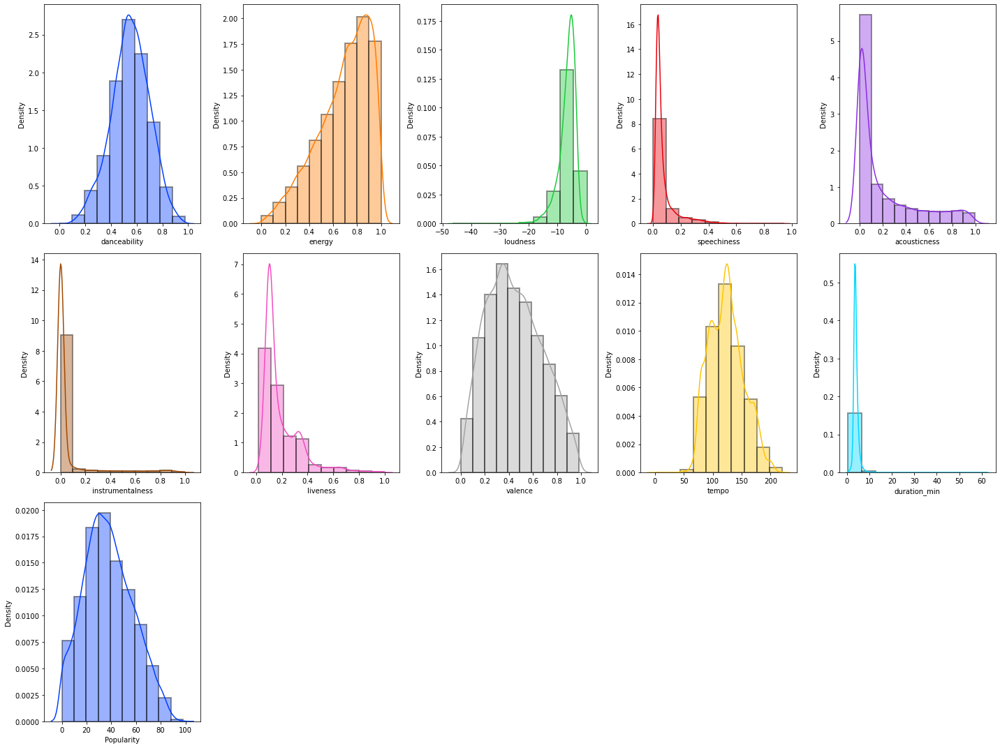

In [69]:
# Utiliser la palette de couleurs seaborn pour une meilleure différenciation
clr = sns.color_palette('bright', len(continuous_var))

# Visualisation des caractéristiques numériques avec des histogrammes
print('\033[1mNumeric Features Distribution'.center(100))

n = 5

# Augmenter la taille de la figure pour une meilleure visibilité
plt.figure(figsize=[20, 5 * math.ceil(len(continuous_var) / n)])
for i in range(len(continuous_var)):
    # Créer un sous-plot pour chaque caractéristique numérique
    plt.subplot(math.ceil(len(continuous_var) / n), n, i + 1)
    # Dessiner un histogramme pour la caractéristique numérique actuelle
    sns.distplot(dataframe[continuous_var[i]], hist_kws=dict(edgecolor="black", linewidth=2), bins=10, color=clr[i])
plt.tight_layout()
plt.show()

On remarque que les variables: tempo,valence,popularity ont des distributions symétriques, tandis que le reste des variables continues ont des distributions asymétriques:  
-   Asymétrique à droite (loudness,energy)  
-   Asymétrique à gauche (liveness,instrumentalness,duration_min,acousticness)

Regardons de plus prés la distribution de la variable `Popularity` 

Moyenne de la Popularité : 37.58
Écart type de la Popularité : 19.72


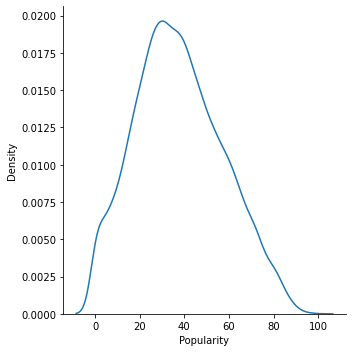

In [92]:
# Générer un graphique KDE
sns.displot(dataframe['Popularity'], kind='kde')

# Extraire les valeurs numériques associées au graphique
kde = gaussian_kde(dataframe['Popularity'])
x_values = np.linspace(min(dataframe['Popularity']), max(dataframe['Popularity']), 1000)
y_values = kde(x_values)

# Calculer la moyenne et l'écart type
moyenne = np.mean(dataframe['Popularity'])
ecart_type = np.std(dataframe['Popularity'])

# Afficher les statistiques numériques
print(f"Moyenne de la Popularité : {moyenne:.2f}")
print(f"Écart type de la Popularité : {ecart_type:.2f}")



Nous remarquon qu'elle a une moyenne de 37.58, et un écart type de 19.72 ce qui reflète une variabilité considérable autour de cette moyenne. Nous remarquons aussi un manque de musiques avec des popularités elevées et des popularités proches de 0.

#### II. 2.1.2. Variables categorielles:

Les variables 'key' et 'mode', présentent un caractère distinct dans leur distribution, car elles ne sont pas continues, mais plutôt discrètes. Afin d'avoir une visualisation plus claire, nous proposons de visualiser la fréquence des valeurs prises par chaque variable catégorielle.

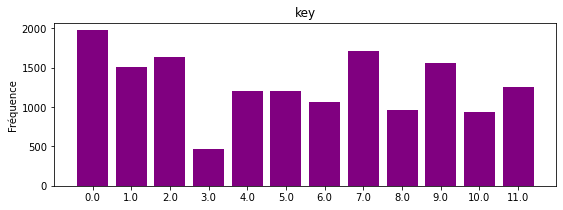

key:
0.0     1972
7.0     1715
2.0     1631
9.0     1555
1.0     1504
11.0    1260
4.0     1199
5.0     1198
6.0     1069
8.0      968
10.0     942
3.0      469
Name: key, dtype: int64


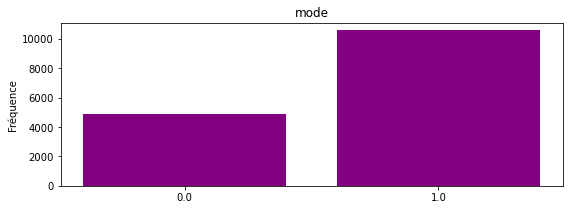

mode:
1.0    10571
0.0     4911
Name: mode, dtype: int64


In [93]:
category = ['key', 'mode']
for variable in category:
    var=dataframe[variable]
    var_value= var.value_counts()
    
    plt.figure(figsize=(9,3))
    plt.bar(var_value.index,var_value,color="purple")
    plt.xticks(var_value.index,var_value.index.values)
    plt.ylabel("Fréquence")
    plt.title(variable)
    plt.show()
    print("{}:\n{}".format(variable,var_value))

- Pour la variable 'key', les valeurs 0.0, 7.0 et 2.0 sont les plus fréquentes, ce qui suggère une concentration spécifique.  
- Concernant 'mode', la valeur '1.0' est plus fréquente que '0.0', ce qui indique une certaine asymétrie dans sa distribution.

### II. 2.2. Quelques caractéristiques du dataset

Visualisons nos données pour comprendre la répartition des musiques sélectionnées en fonction de leur année de sortie.

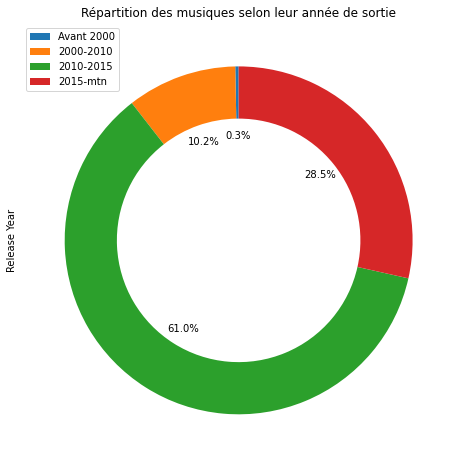

In [94]:
# Spécifier les intervalles et les étiquettes
bins = [0, 2000, 2010, 2015, 2023]
labels = ['Avant 2000', '2000-2010', '2010-2015', '2015-mtn']

# Créer le diagramme en camembert
plt.figure(figsize=(8, 8))
pd.cut(dataframe['Release Year'], bins=bins, labels=labels, include_lowest=True).value_counts().sort_index().plot.pie(autopct='%1.1f%%', startangle=90, wedgeprops=dict(width=0.3), labels=None)

plt.title("Répartition des musiques selon leur année de sortie")
plt.legend(labels=labels, loc='upper left')
plt.show()

On remarque qu'une grande partie de nos données est concentrée entre 2010 et 2015

Regardons maintenant comment sont réparties les musiques populaires au travers de nos artistes. Pour cela, nous définissons un seuil de 75, au delà duquel nous considérons que les musiques sont populaires. Nous regardons ensuite qui sont nos artistes les plus populaires.

In [95]:
popu_artists = dataframe[dataframe['Popularity'] > 75].groupby('Artist Name').count().sort_values('Track Name', ascending=False)
popu_artists = popu_artists.iloc[:,:1]
popu_artists.columns = ['total_pop_tracks']
popu_artists.head()

,total_pop_tracks
Artist Name,
Taylor Swift,42
Kendrick Lamar,12
Rihanna,11
Drake,11
Bruno Mars,8


### II. 3. Relation entre les variables 

#### II. 3.1. Choix de variables

Afin de choisir les variables à utiliser nous devons vérifier qu'ils n'existent pas de relation linéaire forte entre elles.

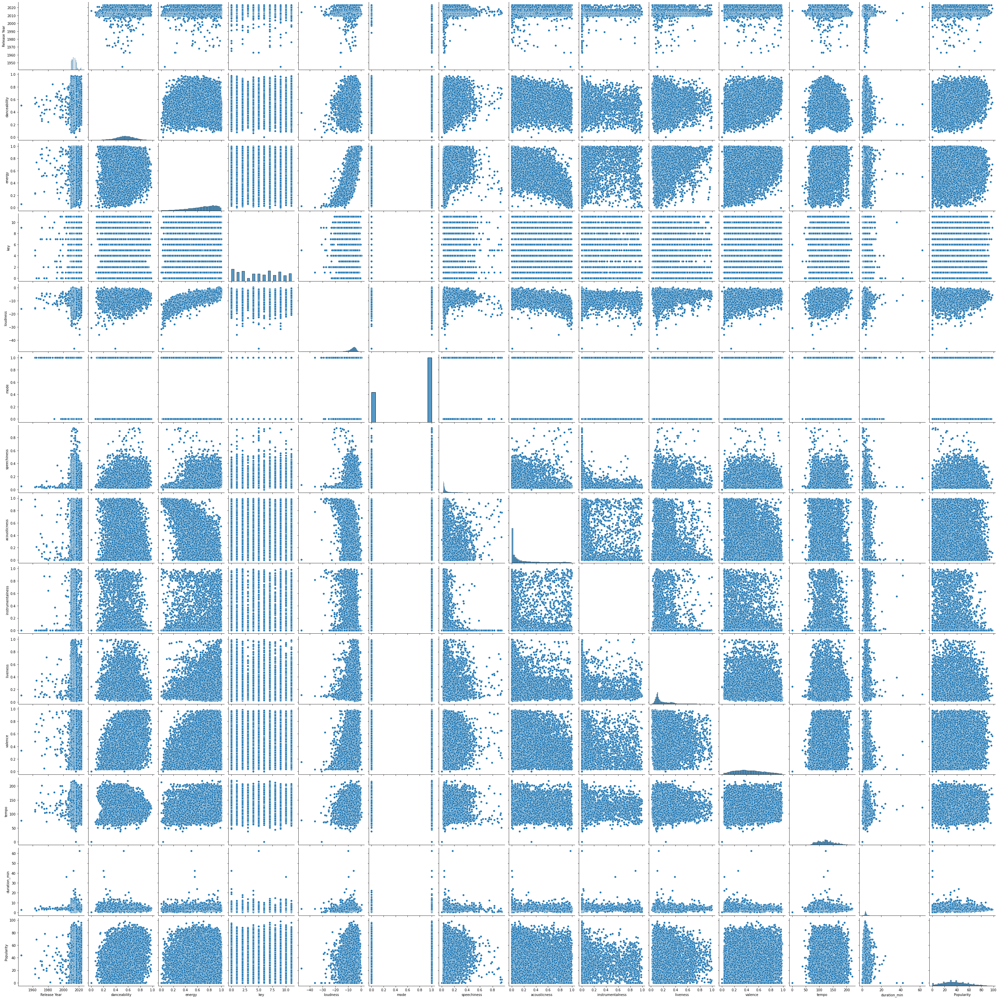

In [101]:
sns.pairplot(dataframe)

<AxesSubplot:xlabel='energy', ylabel='loudness'>

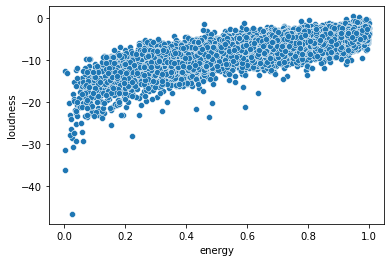

In [102]:
sns.scatterplot(x='energy', y='loudness', data=dataframe)

<AxesSubplot:xlabel='energy', ylabel='acousticness'>

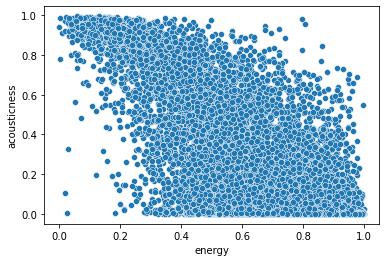

In [105]:
sns.scatterplot(x='energy', y='acousticness', data=dataframe)

Nous observons qu'il n'existe pas de relation linéaire évidente entre les paires de variables, à l'exception des 2 graphiques mettant en relation la variable `energy` avec `loudness` et `acousticness`, qui semblent indiquer une relation quasi-linéaire.

Vérifions cela à travers la matrice de corrélation.

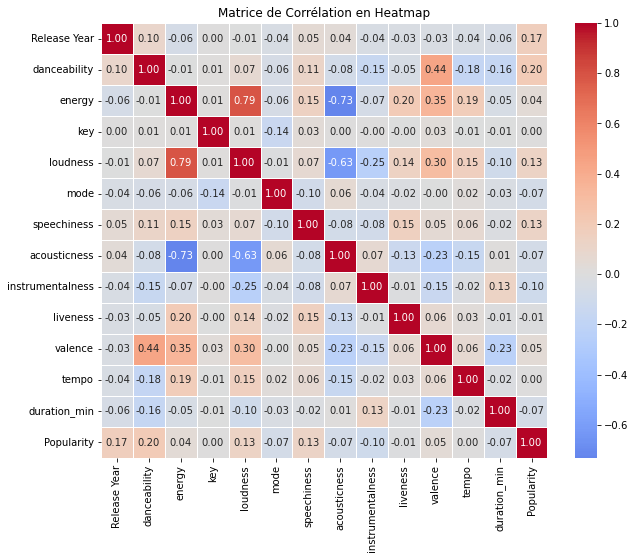

In [103]:
excluded_columns = ['Artist Name', 'Track Name']
selected_data = dataframe.drop(columns=excluded_columns)

correlation_matrix = selected_data.corr()

plt.figure(figsize=(10, 8))

sns.heatmap(correlation_matrix, annot=True, center=0, cmap='coolwarm', fmt=".2f", linewidths=.5)

plt.title('Matrice de Corrélation en Heatmap')
plt.show()

Nous remarquons bien que la variable `energy` a une corrélation forte avec `loudness`, de plus elle a aussi une corrélation forte avec `accousticness`, supérieur à 0,70. D'autant plus que cette variable a une corrélation faible avec `popularity`. Ce qui fait que nous décidons ainsi de l'enlever.

Nous remarquons aussi qu'aucune des variables n'a une corrélation forte ( proche de 1 ou -1) avec la popularité. Cela signifie qu'aucune variable individuelle ne peut prédire parfaitement la popularité. Cependant, cela ne signifie pas nécessairement qu'on ne peut pas prédire la popularité à partir de la combinaison de ces variables. 

In [123]:
dataframe.drop('energy', axis=1, inplace=True)

In [125]:
continuous_var.remove('energy')
print(continuous_var)

['danceability', 'loudness', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_min', 'Popularity']


#### II. 3.2. Relation entre Popularity et les autres variables

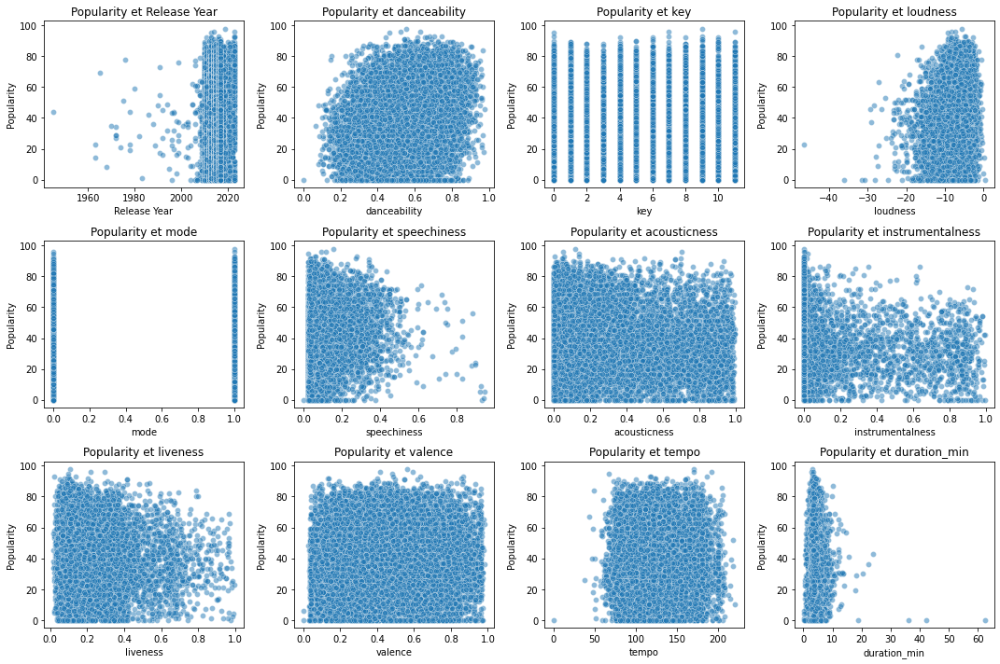

In [98]:
# Variables spécifiées
autres_variables = ['Release Year', 'danceability', 'key', 'loudness', 'mode',
                    'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence',
                    'tempo', 'duration_min']

# Calculer le nombre de lignes et de colonnes nécessaires pour les graphiques
num_rows = 3
num_cols = (len(autres_variables) + num_rows - 1) // num_rows

# Créer une grille de sous-tracés avec 3 lignes
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 10))

# Aplatir la grille pour itérer facilement sur les sous-tracés
axes = axes.flatten()

# Itérer sur les variables et créer les graphiques
for i, variable in enumerate(autres_variables):
    sns.scatterplot(x=variable, y='Popularity', data=dataframe, ax=axes[i], alpha=0.5)
    axes[i].set_title(f"Popularity et {variable}")

# Supprimer les sous-tracés inutilisés (s'il y en a)
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

# Ajuster l'espacement entre les sous-tracés pour une meilleure lisibilité
fig.tight_layout()

# Afficher les graphiques
plt.show()

Ces graphiques mettent bien en évidence la difficulté à percevoir une relation linéaire entre la popularité et le reste des variables. Cependant, comme nous l'avons expliqué cela n'exclut pas la possibilité d'une relation linéaire entre la popularité et l'ensemble des variables.

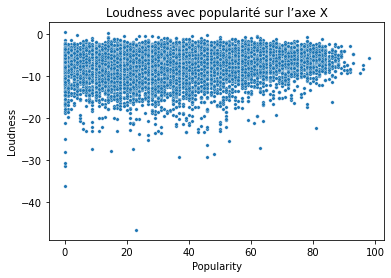

In [97]:
sns.scatterplot(x='Popularity', y='loudness',data=dataframe, s=12)

plt.xlabel('Popularity')
plt.ylabel('Loudness')
plt.title('Loudness avec popularité sur l’axe X')

plt.show()

Le graphique ci-dessus montre la distribution du Loudness avec popularité sur l’axe X. Cela montre que les valeurs de Loudness les plus élevées peuvent être trouvées dans tout le spectre de popularité, mais que à mesure que l'axe X augmente, les groupements deviennent de plus en plus concentrés vers le sommet. En d’autres termes, Loudness ne garantit pas la popularité, mais de faibles niveaux de Loudness semblent exclure la popularité.

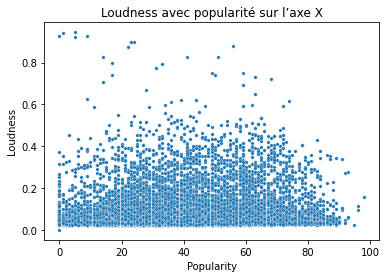

In [107]:
sns.scatterplot(x='Popularity', y='speechiness',data=dataframe, s=12)

plt.xlabel('Popularity')
plt.ylabel('Loudness')
plt.title('Loudness avec popularité sur l’axe X')

plt.show()

De même, nous remarquons que des niveaux élevés de `Loudness` semblent exclure la popularité.

### II. 4. Elimination des valeurs abérrantes 

Afin de visualiser les valeurs abérrantes, nous commençons par regarder le min et max des différentes variables continues

In [126]:
dataframe[continuous_var].describe().round(2)

,danceability,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_min,Popularity
count,15482.00,15482.00,15482.00,15482.00,15482.00,15482.00,15482.00,15482.00,15482.00,15482.00
mean,0.55,-6.60,0.08,0.20,0.05,0.19,0.45,123.68,3.94,37.58
std,0.15,3.10,0.09,0.27,0.17,0.15,0.23,29.43,1.27,19.72
min,0.00,-46.51,0.00,0.00,0.00,0.02,0.00,0.00,0.17,0.00
25%,0.45,-7.88,0.03,0.01,0.00,0.10,0.27,100.06,3.32,23.00
50%,0.55,-5.93,0.05,0.06,0.00,0.13,0.43,122.74,3.75,36.00
75%,0.65,-4.55,0.08,0.31,0.00,0.25,0.62,142.65,4.31,51.00
max,0.98,0.38,0.94,1.00,0.99,1.00,0.98,220.22,62.48,98.00


Nous savons déjà d'après la documentation de l'API spotify que les variables :  Acousticness, Danceability, Instrumentalness, Liveness, Speechiness et Valence ont des valeurs entre 0 et 1.
Donc nous nous intéressons qu'aux variables : Popularity, Duration_s, Tempo et Loudness pour vérifier si on a des outliers dans notre dataset.

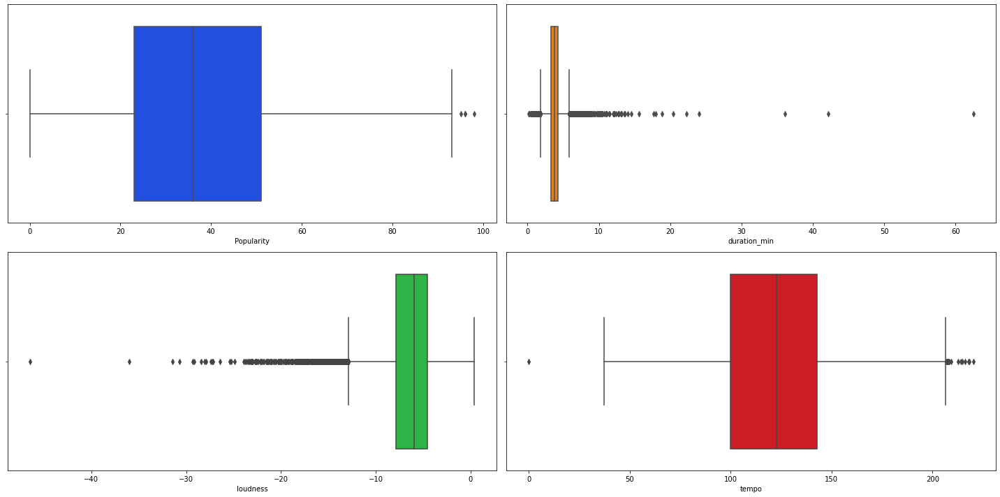

In [127]:
selected_vars = ['Popularity', 'duration_min', 'loudness', 'tempo']

clr = sns.color_palette('bright', len(selected_vars))

n = 2 

plt.figure(figsize=[20, 5 * math.ceil(len(selected_vars) / n)])
for i in range(len(selected_vars)):
    plt.subplot(math.ceil(len(selected_vars) / n), n, i + 1)
    sns.boxplot(x=dataframe[selected_vars[i]], color=clr[i])
plt.tight_layout()
plt.show()

En examinant notre ensemble de données, nous remarquons l'existence de valeurs aberrantes qui peuvent influencer négativement nos analyses. Pour avoir de meilleurs résultats, nous avons décidé d'éliminer ces valeurs extrêmes. En retirant ces observations, nous nous assurons d'obtenir des analyses plus fiables et représentatives de l'ensemble des données:

In [128]:
for var in selected_vars:
    Q1=dataframe[var].quantile(0.25)
    Q3=dataframe[var].quantile(0.75)
    IQR=Q3-Q1
    dataframe=dataframe[(dataframe[var]>=Q1-1.5*IQR)&(dataframe[var]<=Q3+1.5*IQR)]

#  III. Modélisation

## III. 1. Data Preprocessing

In [161]:
X = dataframe.drop(columns= ['Popularity', 'Track Name','Artist Name'])
y = dataframe['Popularity']

# Séparer les données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [162]:
print(X_train.columns)

Index(['Release Year', 'danceability', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'duration_min', 'key_1.0', 'key_2.0', 'key_3.0', 'key_4.0', 'key_5.0',
       'key_6.0', 'key_7.0', 'key_8.0', 'key_9.0', 'key_10.0', 'key_11.0'],
      dtype='object')


Etant donné que les 2 variables : `key` et `mode` sont des variables catégorielles.
Les 2 variables prennent des valeurs bien précises et ces valeurs ne sont pas ordinales. 

Nous utilisons ainsi le One-hot encoding afin que nos modèles spécialement linéaires ne les interprétent pas comme des données ordinales mais plutôt comme des catégories.

De plus, afin de ne pas tomber dans le "Dummy Variable Trap", on va drop la première variable (colonne) des dummies variables.  

In [159]:
dataframe = pd.get_dummies(dataframe, columns=['key'], drop_first=True)

Même si la variable mode a deux catégories: Minor et Major, on n'a pas besoin de l'encoder. Si on le fait, on aura deux colonnes : mode_0 et mode_1 qui sont parfaitement négativement corrélés ce qui fait qu'on aura de la redondance d'informations.

Dans cette étape du prétraitement, nous utilisons la méthode de la mise à l'échelle standard pour normaliser les caractéristiques numériques de notre ensemble de données. Nos variables explicatives auront par la suite une moyenne de 0 et un écart type de 1, ce qui permet de traiter toutes les caractéristiques sur pied d'égalité indépendamment de leur échelle d'origine.

In [163]:
scaler = StandardScaler()

# List of columns to scale
columns_to_scale = ['Release Year', 'danceability', 'loudness', 'speechiness', 'acousticness',
                       'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_min']


# Fit the scaler and transform the columns of X_train
X_train[columns_to_scale] = scaler.fit_transform(X_train[columns_to_scale])

# Transform the columns of X_test using the same scaler
X_test[columns_to_scale] = scaler.transform(X_test[columns_to_scale])

c:\Users\tahah\anaconda3\lib\site-packages\pandas\core\frame.py:3678: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[col] = igetitem(value, i)
c:\Users\tahah\anaconda3\lib\site-packages\pandas\core\frame.py:3678: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self[col] = igetitem(value, i)


## III. 2. Les modèles

Cette section détaille les étapes entreprises pour identifier l'algorithme optimal dans la prédiction de la popularité.

### III. 2.1. Modèles linéaires basiques

 Nous avons commencé par appliquer un modèle de régression linéaire basique, puis nous avons utilisé Ridge. Même en utilisant une régularisation avec la régression ridge, les résultats demeuraient insatisfaisants, comme le suggèrent les nombreuses visualisations précédentes.Ensuite j'ai progressé vers des méthodes d'ensemble telles que le bagging, le Random Forest et le boosting, ce qui a amélioré la précision.

Pour surmonter les difficultés rencontrées, j'ai décidé d'augmenter la taille de ma base de données. Cette décision a été motivée par le constat de problèmes liés à l'utilisation de ma base de données initiale réduite, notamment des résultats de modélisation insatisfaisants et une performance médiocre des algorithmes. L'expansion de la base de données visait à atténuer ces problèmes, fournissant ainsi un ensemble de données plus robuste et informatif pour l'entraînement des modèles.

### III. 2.1.1. Régression linéaire

In [164]:
model = LinearRegression()
model.fit(X_train, y_train)

LinearRegression()

In [165]:
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
print(f'Mean Squared Error: {mse}')

Mean Squared Error: 346.5544127679965


Nous trouvons une valeurs trop elevé pour l'erreur quadratique moyenne. Visualisons de plus près la prédiction.

In [166]:
def plot_actual_vs_predicted(y_test, y_pred):
    plt.figure(figsize=(9,6))
    plt.scatter(y_test, y_pred, alpha=0.3)
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2, color='r')
    plt.xlabel('Actual')
    plt.ylabel('Predicted')
    plt.title('Actual vs Predicted')
    plt.show()

In [167]:
def plot_coefficients(model, X_train):
    # Récupérer les coefficients
    coefficients = model.coef_

    # Créer une série pour faciliter le tracé
    coef_series = pd.Series(coefficients, index=X_train.columns)

    # Tracer les coefficients
    plt.figure(figsize=(10, 5))
    coef_series.plot(kind='bar')
    plt.title('Coefficients des Variables')
    plt.show()

C:\Users\tahah\AppData\Local\Temp/ipykernel_10824/2765966909.py:4: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2, color='r')


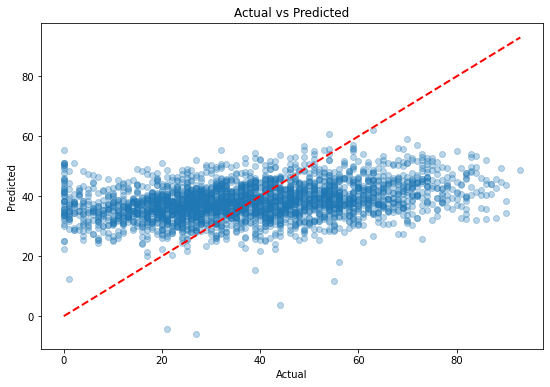

In [168]:
plot_actual_vs_predicted(y_test, y_pred)

Nous remarquons que la plupart des valeurs prédites sont autour de 38, ce qui n'est autre que la moyenne de notre popularité de la base de données. Avant de trancher que les variables explicatives ou les données ne sont pas adéquates nous allons tester plus de modèles.

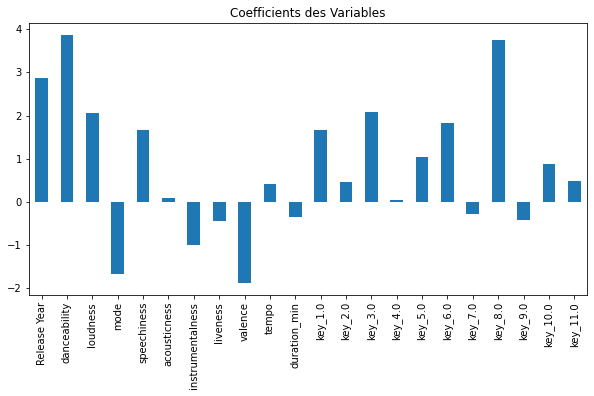

In [169]:
plot_coefficients(model, X_train)

Nous remarquons que notre prédiction linéaire n'est pas efficace. 

### III. 2.1.2. Régression de Ridge

In [170]:
# Les valeurs d'alpha à tester
alphas = [0.001, 0.01, 0.1, 1, 10, 100, 1000]

# Créer un objet RidgeCV
ridge_cv = RidgeCV(alphas=alphas, cv=5)

# Adapter le modèle aux données d'entraînement
ridge_cv.fit(X_train, y_train)

# Obtenir le alpha optimal
optimal_alpha = ridge_cv.alpha_
print(f"Alpha optimal : {optimal_alpha}")

# Prédire sur l'ensemble de test
y_pred = ridge_cv.predict(X_test)

# Calculer l'erreur quadratique moyenne
mse = mean_squared_error(y_test, y_pred)
print(f"Mean Squared Error pour alpha optimal : {mse}")

Alpha optimal : 100.0
Mean Squared Error pour alpha optimal : 346.5171135732639


Même MSE à peu près, donc l'ajout de la régularisation dans la regression de Ridge n'a pas conduit à une amélioration de la performance.

C:\Users\tahah\AppData\Local\Temp/ipykernel_10824/2765966909.py:4: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2, color='r')


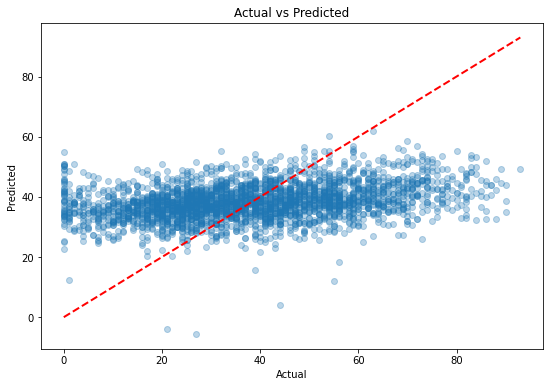

In [171]:
plot_actual_vs_predicted(y_test, y_pred)

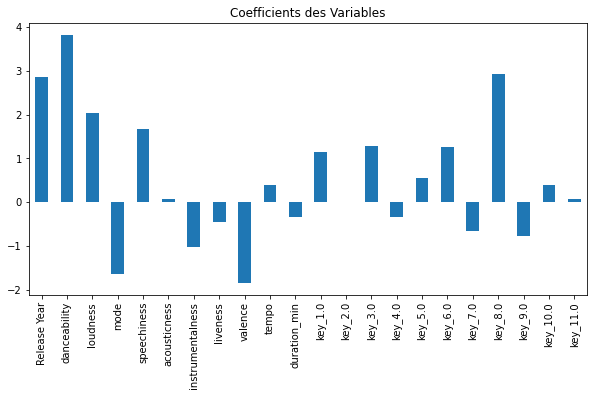

In [172]:
plot_coefficients(ridge_cv, X_train)

Nous retrouvons un peu les mêmes résultats, la plupart des valeurs prédites sont autour de 38, et les coefficients sont les mêmes. On conclut que les 2 modèles ne font qu'une moyenne sur les données et n'essaient pas d'apprendre 
Cela suggère que nos modèles ont tendance à prédire des valeurs proches de la moyenne, ce qui pourrait indiquer qu'ils ne sont pas suffisamment sensibles aux variations dans les caractéristiques des données. Il serait donc bénéfique d'explorer d'autres modèles ou techniques pour améliorer la performance de nos modèles.

### III. 2.2. Modèles de regréssions plus complexes

### III. 2.2.1. Random Forest Regressor 

In [173]:
# Initialize the Random Forest Regressor
rf = RandomForestRegressor(n_estimators=100, random_state=42)

# Fit the model on the training data
rf.fit(X_train, y_train)

# Make predictions on the test data
y_pred = rf.predict(X_test)

# Calculate the mean squared error of the predictions
mse = mean_squared_error(y_test, y_pred)

print(f"Mean Squared Error: {mse}")

Mean Squared Error: 339.6826353510029


C:\Users\tahah\AppData\Local\Temp/ipykernel_10824/2765966909.py:4: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2, color='r')


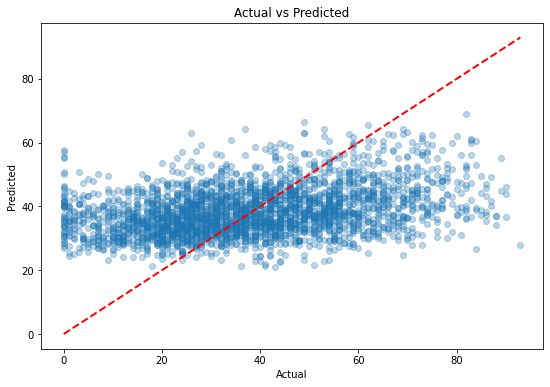

In [174]:
plot_actual_vs_predicted(y_test, y_pred)

Nous remarquons qu'on a une petite amélioration pour les popularité les plus élevés, cependant notre modèle n'arrive toujours pas à trouver une relation entre les données.

### III. 2.2.2. Gradient Boosting Regressor

In [182]:
# Initialize the Gradient Boosting Regressor
gbr = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)

# Fit the model on the training data
gbr.fit(X_train, y_train)

# Make predictions on the test data
y_pred = gbr.predict(X_test)

# Calculate the mean squared error of the predictions
mse = mean_squared_error(y_test, y_pred)

print(f"Mean Squared Error: {mse}")

Mean Squared Error: 332.4787048930297


C:\Users\tahah\AppData\Local\Temp/ipykernel_10824/2765966909.py:4: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2, color='r')


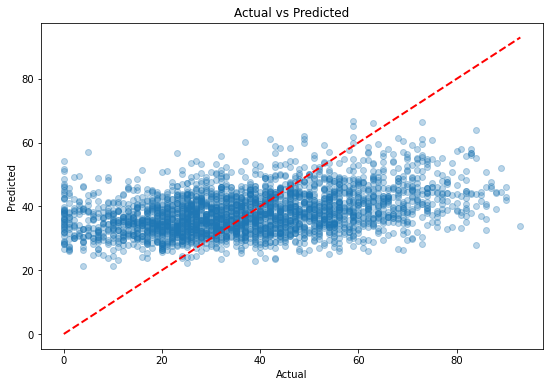

In [176]:
plot_actual_vs_predicted(y_test, y_pred)

Même si on a une petite amélioration encore avec ce modèle de Gradient Boosting Regressor, ce n'est pas suffisant, vu qu'une MSE de `332` signifie que nos prédictions sont en moyenne à une distance de la racine carrée de `332` (soit environ `18.2`) des valeurs réelles. C'est une erreur qui reste assez importante si nous considérons l'échelle de notre variable cible.

#  IV. Solutions

Afin d'améliorer les résultats, nous commençons d'abord par être plus restrictifs sur le choix des variables en utilisant cette fois Lasso. De plus, nous allons essayé dans un premier temps d'augmenter la base de données pour avoir des relations plus importantes entre la variable cible et les autres variables explicatives.

In [177]:
lasso_cv = LassoCV(cv=5)  
lasso_cv.fit(X_train, y_train)
best_alpha = lasso_cv.alpha_
alpha = best_alpha   
lasso_model = Lasso(alpha=alpha)
lasso_model.fit(X_train, y_train)
y_pred = lasso_model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'Mean Squared Error: {mse}')
print(f'R-squared: {r2}')

Mean Squared Error: 347.0728228466394
R-squared: 0.09949966732901094


C:\Users\tahah\AppData\Local\Temp/ipykernel_10824/2765966909.py:4: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2, color='r')


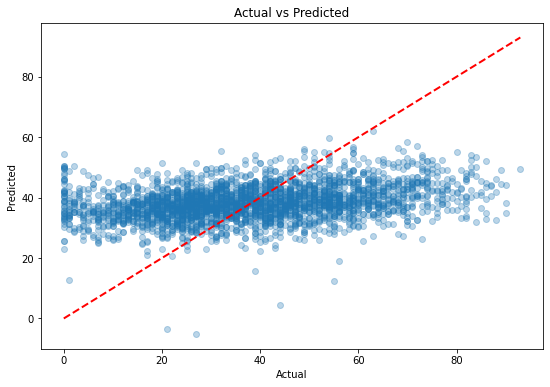

In [178]:
plot_actual_vs_predicted(y_test, y_pred)

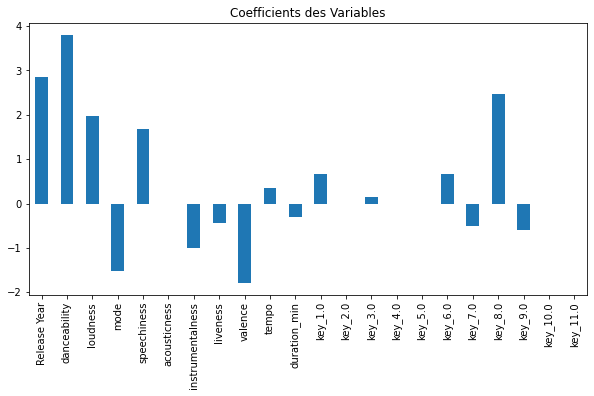

In [179]:
plot_coefficients(lasso_model, X_train)

In [180]:
X_train.drop(['acousticness', 'key_2.0', 'key_4.0', 'key_5.0', 'key_10.0', 'key_11.0'], axis=1, inplace=True)
X_test.drop(['acousticness', 'key_2.0', 'key_4.0', 'key_5.0', 'key_10.0', 'key_11.0'], axis=1, inplace=True)

c:\Users\tahah\anaconda3\lib\site-packages\pandas\core\frame.py:4906: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


In [187]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report

# Load the dataset (replace 'your_dataset.csv' with your actual dataset file)


# Define popularity threshold (top 25% as "popular")
popularity_threshold = dataframe['Popularity'].quantile(0.75)
dataframe['is_popular'] = (dataframe['Popularity'] >= popularity_threshold).astype(int)

# Features and target variable
features = dataframe.drop(['Popularity', 'is_popular','Artist Name', 'Track Name'], axis=1)  # Adjust columns accordingly
target = dataframe['is_popular']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

# Create and train the model (Random Forest Classifier as an example)
model = RandomForestClassifier(random_state=42)
model.fit(X_train, y_train)

# Make predictions
predictions = model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, predictions)
report = classification_report(y_test, predictions)

print(f"Model Accuracy: {accuracy}")
print("Classification Report:\n", report)


Model Accuracy: 0.7507163323782235
Classification Report:
               precision    recall  f1-score   support

           0       0.76      0.96      0.85      2068
           1       0.58      0.14      0.23       724

    accuracy                           0.75      2792
   macro avg       0.67      0.55      0.54      2792
weighted avg       0.71      0.75      0.69      2792



## IV.1. Augmentation de la base de données

### IV.1.1. Concaténation des deux bases de données

Afin d'avoir de meilleurs résultats, nous allons combiner notre base de données `data1` à une deuxième base de données de données de 169k musiques `data2`. 

In [211]:
data1 = pd.read_csv('dataframe.csv')

In [212]:
data2 = pd.read_csv('data.csv')


In [203]:
data1.columns

Index(['Track Name', 'Artist Name', 'Release Year', 'danceability', 'energy',
       'key', 'loudness', 'mode', 'speechiness', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_min',
       'Popularity'],
      dtype='object')

In [189]:
data2.columns


Index(['acousticness', 'artists', 'danceability', 'duration_ms', 'energy',
       'explicit', 'id', 'instrumentalness', 'key', 'liveness', 'loudness',
       'mode', 'name', 'popularity', 'release_date', 'speechiness', 'tempo',
       'valence', 'year'],
      dtype='object')

In [204]:
data2.head()


,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,valence,year
0,0.995,['Carl Woitschach'],0.708,158648,0.1950,0,6KbQ3uYMLKb5jDxLF7wYDD,0.563,10,0.1510,-12.428,1,Singende Bataillone 1. Teil,0,1928,0.0506,118.469,0.7790,1928
1,0.994,"['Robert Schumann', 'Vladimir Horowitz']",0.379,282133,0.0135,0,6KuQTIu1KoTTkLXKrwlLPV,0.901,8,0.0763,-28.454,1,"Fantasiestücke, Op. 111: Più tosto lento",0,1928,0.0462,83.972,0.0767,1928
2,0.604,['Seweryn Goszczyński'],0.749,104300,0.2200,0,6L63VW0PibdM1HDSBoqnoM,0.000,5,0.1190,-19.924,0,Chapter 1.18 - Zamek kaniowski,0,1928,0.9290,107.177,0.8800,1928
3,0.995,['Francisco Canaro'],0.781,180760,0.1300,0,6M94FkXd15sOAOQYRnWPN8,0.887,1,0.1110,-14.734,0,Bebamos Juntos - Instrumental (Remasterizado),0,1928-09-25,0.0926,108.003,0.7200,1928
4,0.990,"['Frédéric Chopin', 'Vladimir Horowitz']",0.210,687733,0.2040,0,6N6tiFZ9vLTSOIxkj8qKrd,0.908,11,0.0980,-16.829,1,"Polonaise-Fantaisie in A-Flat Major, Op. 61",1,1928,0.0424,62.149,0.0693,1928


Nous remarquons que les noms des colonnes ne sont pas les mêmes, en plus de quelques colonnes qu'on n'a pas dans notre base de données. D'autant plus les noms d'artiste sont stockés sous forme de liste.

Corrigeons tout cela ! 

In [213]:
data2.drop(columns=['explicit', 'id', 'release_date'], inplace=True)
data2['duration_ms'] = data2['duration_ms'] /60000  
data2 = data2.rename(columns={
    'artists': 'Artist Name',
    'name': 'Track Name',
    'year': 'Release Year',
    'popularity': 'Popularity',
    'duration_ms': 'duration_min', 
})


print(data2.columns)

Index(['acousticness', 'Artist Name', 'danceability', 'duration_min', 'energy',
       'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'Track Name',
       'Popularity', 'speechiness', 'tempo', 'valence', 'Release Year'],
      dtype='object')


In [210]:
print(data2.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 169909 entries, 0 to 169908
Data columns (total 16 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   acousticness      169909 non-null  float64
 1   artists           169909 non-null  object 
 2   danceability      169909 non-null  float64
 3   duration_ms       169909 non-null  float64
 4   energy            169909 non-null  float64
 5   instrumentalness  169909 non-null  float64
 6   key               169909 non-null  int64  
 7   liveness          169909 non-null  float64
 8   loudness          169909 non-null  float64
 9   mode              169909 non-null  int64  
 10  name              169909 non-null  object 
 11  popularity        169909 non-null  int64  
 12  speechiness       169909 non-null  float64
 13  tempo             169909 non-null  float64
 14  valence           169909 non-null  float64
 15  year              169909 non-null  int64  
dtypes: float64(10), int6

In [209]:
print(data1.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15482 entries, 0 to 15481
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Track Name        15482 non-null  object 
 1   Artist Name       15482 non-null  object 
 2   Release Year      15482 non-null  float64
 3   danceability      15482 non-null  float64
 4   energy            15482 non-null  float64
 5   key               15482 non-null  float64
 6   loudness          15482 non-null  float64
 7   mode              15482 non-null  float64
 8   speechiness       15482 non-null  float64
 9   acousticness      15482 non-null  float64
 10  instrumentalness  15482 non-null  float64
 11  liveness          15482 non-null  float64
 12  valence           15482 non-null  float64
 13  tempo             15482 non-null  float64
 14  duration_min      15482 non-null  float64
 15  Popularity        15482 non-null  int64  
dtypes: float64(13), int64(1), object(2)
memo

In [214]:
# Convertir les éléments de la colonne "Artist Name" en listes
data2['Artist Name'] = data2['Artist Name'].apply(lambda x: ast.literal_eval(x) if isinstance(x, str) else x)

# Utiliser la fonction lambda pour convertir la liste en une chaîne de caractères
data2['Artist Name'] = data2['Artist Name'].apply(lambda x: ', '.join(x) if isinstance(x, list) else x)

data2.head()

,acousticness,Artist Name,danceability,duration_min,energy,instrumentalness,key,liveness,loudness,mode,Track Name,Popularity,speechiness,tempo,valence,Release Year
0,0.995,Carl Woitschach,0.708,2.644133,0.1950,0.563,10,0.1510,-12.428,1,Singende Bataillone 1. Teil,0,0.0506,118.469,0.7790,1928
1,0.994,"Robert Schumann, Vladimir Horowitz",0.379,4.702217,0.0135,0.901,8,0.0763,-28.454,1,"Fantasiestücke, Op. 111: Più tosto lento",0,0.0462,83.972,0.0767,1928
2,0.604,Seweryn Goszczyński,0.749,1.738333,0.2200,0.000,5,0.1190,-19.924,0,Chapter 1.18 - Zamek kaniowski,0,0.9290,107.177,0.8800,1928
3,0.995,Francisco Canaro,0.781,3.012667,0.1300,0.887,1,0.1110,-14.734,0,Bebamos Juntos - Instrumental (Remasterizado),0,0.0926,108.003,0.7200,1928
4,0.990,"Frédéric Chopin, Vladimir Horowitz",0.210,11.462217,0.2040,0.908,11,0.0980,-16.829,1,"Polonaise-Fantaisie in A-Flat Major, Op. 61",1,0.0424,62.149,0.0693,1928


Maintenant que les deux datasets ont les mêmes colonnes et le même type d'éléments, concaténons les 2

In [215]:
# Concaténer les deux DataFrames verticalement
merged_data = pd.concat([data2, data1], ignore_index=True, sort=False)

# Supprimer les lignes en double basées sur les colonnes "Track Name" et "Artist Name"
merged_data = merged_data.drop_duplicates(subset=['Track Name', 'Artist Name'])

# Réinitialiser l'index après la suppression des doublons
merged_data.reset_index(drop=True, inplace=True)


Vérifions qu'on n'a pas de valeurs Nan

In [220]:
# Compter le nombre de valeurs NaN dans chaque colonne avant la suppression
nan_count_before = merged_data.isnull().sum()

# Afficher le nombre de valeurs NaN par colonne
print(nan_count_before)

acousticness        0
Artist Name         0
danceability        0
duration_min        0
energy              0
instrumentalness    0
key                 0
liveness            0
loudness            0
mode                0
Track Name          0
Popularity          0
speechiness         0
tempo               0
valence             0
Release Year        0
dtype: int64


### IV.1.2. Visualisation de la nouvelle base de données

In [217]:
merged_data.head()

,acousticness,Artist Name,danceability,duration_min,energy,instrumentalness,key,liveness,loudness,mode,Track Name,Popularity,speechiness,tempo,valence,Release Year
0,0.995,Carl Woitschach,0.708,2.644133,0.1950,0.563,10.0,0.1510,-12.428,1.0,Singende Bataillone 1. Teil,0,0.0506,118.469,0.7790,1928.0
1,0.994,"Robert Schumann, Vladimir Horowitz",0.379,4.702217,0.0135,0.901,8.0,0.0763,-28.454,1.0,"Fantasiestücke, Op. 111: Più tosto lento",0,0.0462,83.972,0.0767,1928.0
2,0.604,Seweryn Goszczyński,0.749,1.738333,0.2200,0.000,5.0,0.1190,-19.924,0.0,Chapter 1.18 - Zamek kaniowski,0,0.9290,107.177,0.8800,1928.0
3,0.995,Francisco Canaro,0.781,3.012667,0.1300,0.887,1.0,0.1110,-14.734,0.0,Bebamos Juntos - Instrumental (Remasterizado),0,0.0926,108.003,0.7200,1928.0
4,0.990,"Frédéric Chopin, Vladimir Horowitz",0.210,11.462217,0.2040,0.908,11.0,0.0980,-16.829,1.0,"Polonaise-Fantaisie in A-Flat Major, Op. 61",1,0.0424,62.149,0.0693,1928.0


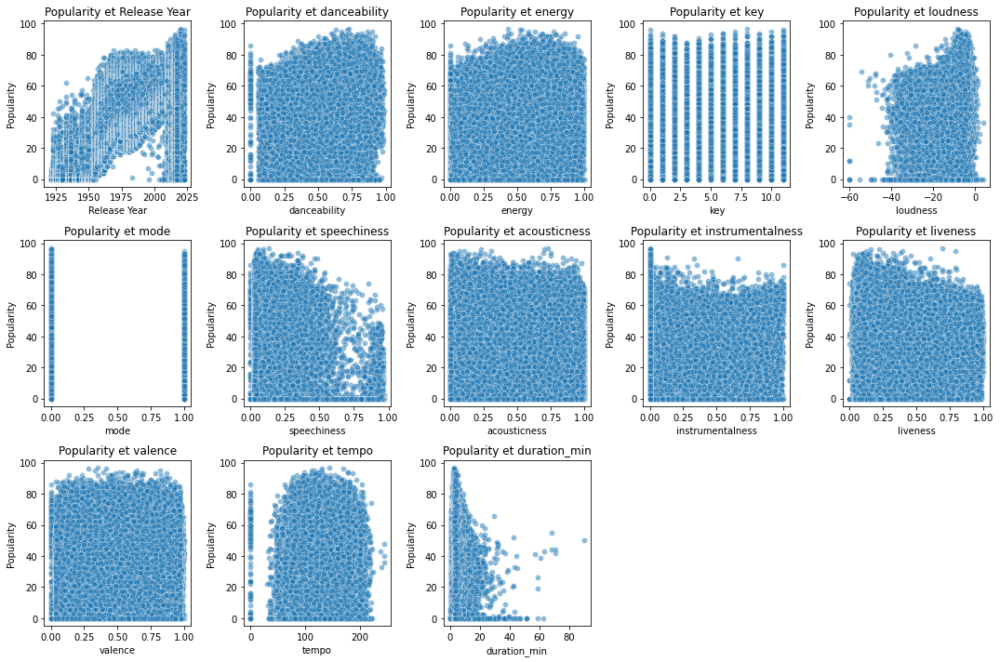

In [219]:
# Variables spécifiées
autres_variables = ['Release Year', 'danceability', 'energy', 'key', 'loudness', 'mode',
                    'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence',
                    'tempo', 'duration_min']

# Calculer le nombre de lignes et de colonnes nécessaires pour les graphiques
num_rows = 3
num_cols = (len(autres_variables) + num_rows - 1) // num_rows

# Créer une grille de sous-tracés avec 3 lignes
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 10))

# Aplatir la grille pour itérer facilement sur les sous-tracés
axes = axes.flatten()

# Itérer sur les variables et créer les graphiques
for i, variable in enumerate(autres_variables):
    sns.scatterplot(x=variable, y='Popularity', data=merged_data, ax=axes[i], alpha=0.5)
    axes[i].set_title(f"Popularity et {variable}")

# Supprimer les sous-tracés inutilisés (s'il y en a)
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

# Ajuster l'espacement entre les sous-tracés pour une meilleure lisibilité
fig.tight_layout()

# Afficher les graphiques
plt.show()

Nous remarquons que dans le cas général, la popularité est une fonction croissante de l'année de sortie. Cependant, pour le reste des variables il n'y a pas de relation linéaire avec `Popularity`

Regardons de plus près ces relations à travers la matrice de corrélation

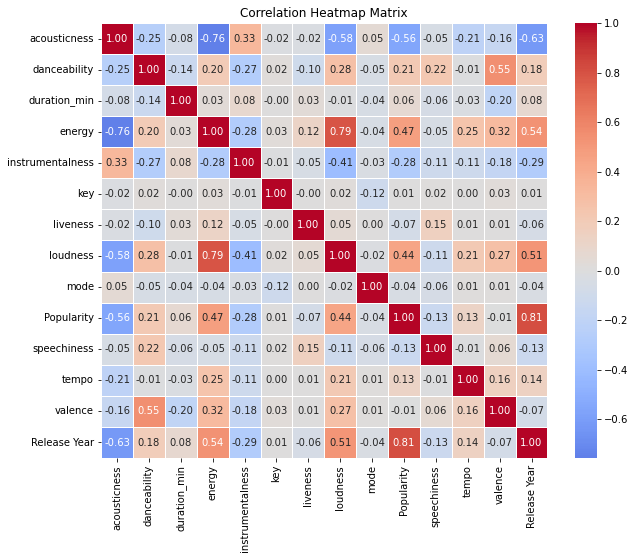

In [221]:
excluded_columns = ['Artist Name', 'Track Name']

selected_data_2 = merged_data.drop(columns=excluded_columns)

correlation_matrix_2 = selected_data_2.corr()

plt.figure(figsize=(10, 8))

sns.heatmap(correlation_matrix_2, annot=True, center=0, cmap='coolwarm', fmt=".2f", linewidths=.5)

plt.title('Correlation Heatmap Matrix')
plt.show()

Nous remarquons que contrairement à la première base de données, nous avons des coefficients plus élevés dans la ligne de `Popularity`. Nous remarquons qu'encore `energy` est fortement corrélé avec `loudness` et `acousticness`. 
Même si la corrélation entre `Popularity` et `energy` est importante nous décidons de l'enlever. En effet, les variables avec lesquelles elle est corrélée ont une corrélation plus forte avec `popularity`.

In [222]:
merged_data.drop('energy', axis=1, inplace=True)

## Choix des variables explicatives


Lasso 

In [124]:
X2 = merged_data.drop(columns= ['Popularity', 'Track Name', 'Artist Name'])

y2 = merged_data['Popularity']
print(merged_data.shape)
print(X2.shape)
print(y2.shape)


X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y2, test_size=0.2, random_state=42)





(169872, 16)
(169872, 13)
(169872,)


In [125]:
scaler = StandardScaler()

# List of columns to scale
columns_to_scale = ['duration_min', 'loudness', 'Release Year']

# Fit the scaler and transform the columns of X_train
X2_train[columns_to_scale] = scaler.fit_transform(X2_train[columns_to_scale])

# Transform the columns of X_test using the same scaler
X2_test[columns_to_scale] = scaler.transform(X2_test[columns_to_scale])


In [126]:
model = LinearRegression()
model.fit(X2_train, y2_train)

LinearRegression()

In [127]:
# Training accuracy
train_accuracy = model.score(X2_train, y2_train)
print(f"Training accuracy: {train_accuracy}")

# Test accuracy
test_accuracy = model.score(X2_test, y2_test)
print(f"Test accuracy: {test_accuracy}")

Training accuracy: 0.6728572643310957
Test accuracy: 0.6716230688065468


In [186]:
y2_pred = model.predict(X2_test)

# Evaluate the model
mse = mean_squared_error(y2_test, y2_pred)
print(f'Mean Squared Error: {mse}')

Mean Squared Error: 143.62064313692278


On remarque que la racine carré du MSE est d'environ 12 ce qui signifie que les prédictions de notre modèle sont en moyenne à 12 points de l'écart par rapport au score de popularité réelle.

## RESIDUAL PLOT

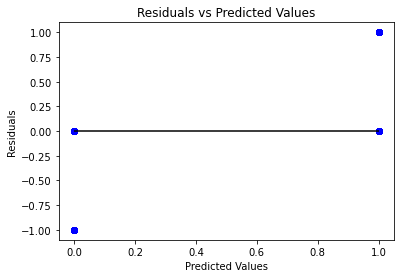

In [225]:
plt.scatter(model.predict(X_test), model.predict(X_test) - y_test, color='blue')
plt.hlines(y=0, xmin=y_test.min(), xmax=y_test.max(), colors='black')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Residuals vs Predicted Values')
plt.show()

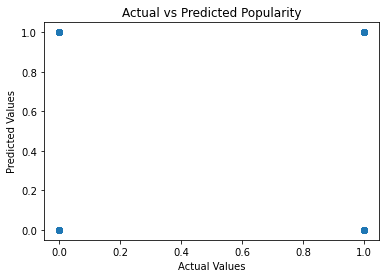

In [226]:
plt.scatter(y_test, model.predict(X_test))
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs Predicted Popularity')
plt.show()

/tmp/ipykernel_267905/2251347967.py:3: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y2_test.min(), y2_test.max()], [y2_test.min(), y2_test.max()], 'k--', lw=2, color='r')


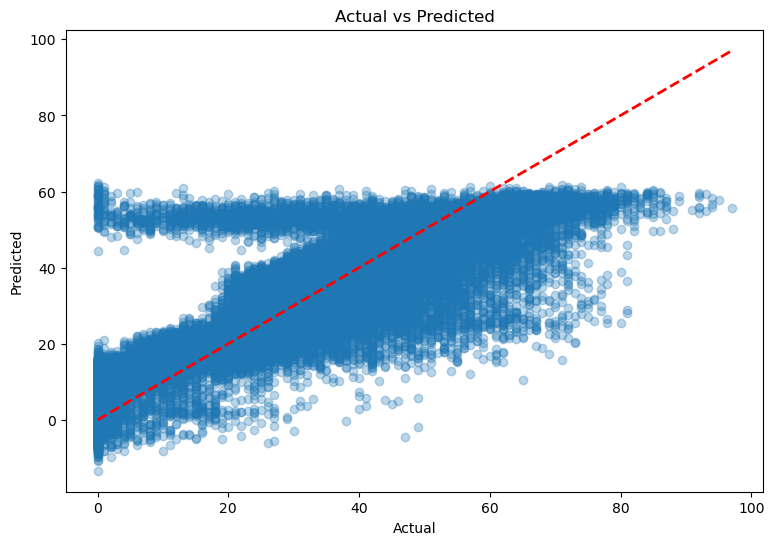

In [188]:

plt.figure(figsize=(9,6))
plt.scatter(y2_test, y2_pred, alpha=0.3)
plt.plot([y2_test.min(), y2_test.max()], [y2_test.min(), y2_test.max()], 'k--', lw=2, color='r')
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Actual vs Predicted')
plt.show()

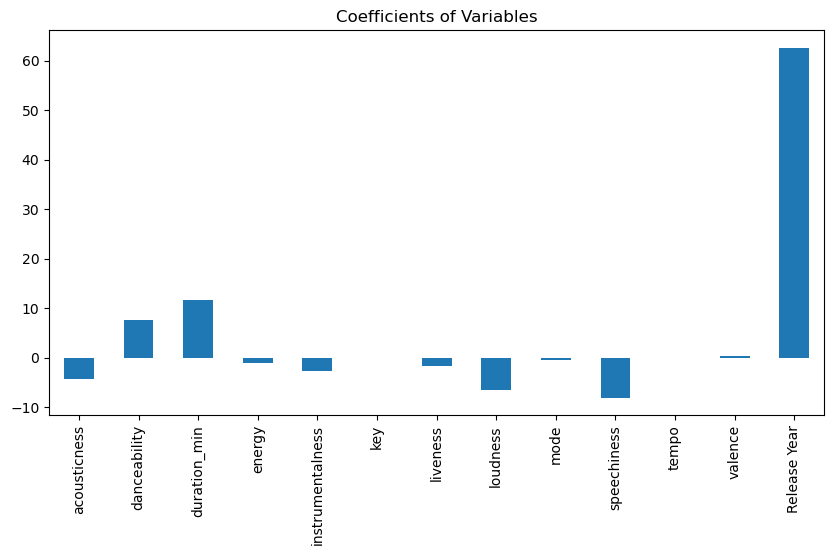

In [205]:
# Get the coefficients
coefficients = model.coef_

# Create a series for easy plotting
coef_series = pd.Series(coefficients, index=X2_train.columns)

# Plot the coefficients
plt.figure(figsize=(10, 5))
coef_series.plot(kind='bar')
plt.title('Coefficients of Variables')
plt.show()

Nous remarquons que le coefficient de Release_Year est le plus elevé, ce qui est logique d'après la documentation de l'API spotify. On a une pénalisation en popularité des musiques plus anciennes.

Training accuracy: 0.6861344872622614
Test accuracy: 0.68373140945916
Mean Squared Error pour alpha=0.001: 143.6206426243185


/tmp/ipykernel_267905/3106141372.py:24: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y2_test.min(), y2_test.max()], [y2_test.min(), y2_test.max()], 'k--', lw=2, color='r')


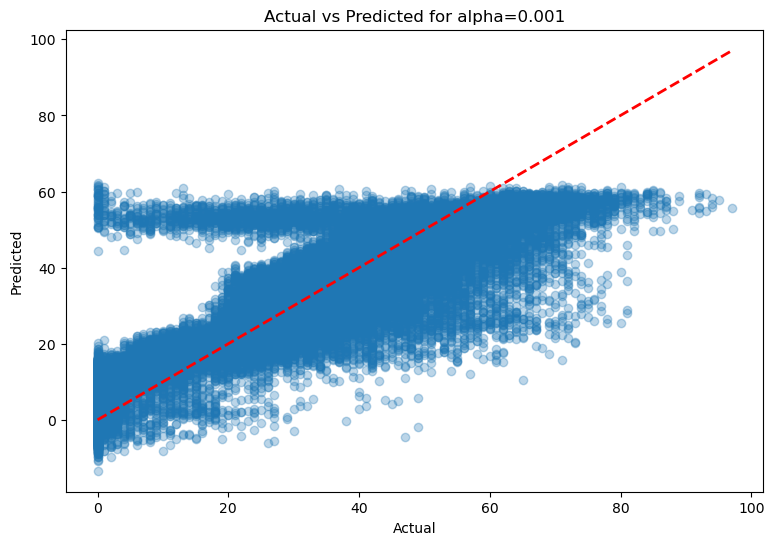

Training accuracy: 0.6861344872569488
Test accuracy: 0.6837314196123447
Mean Squared Error pour alpha=0.01: 143.62063801365852


/tmp/ipykernel_267905/3106141372.py:24: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y2_test.min(), y2_test.max()], [y2_test.min(), y2_test.max()], 'k--', lw=2, color='r')


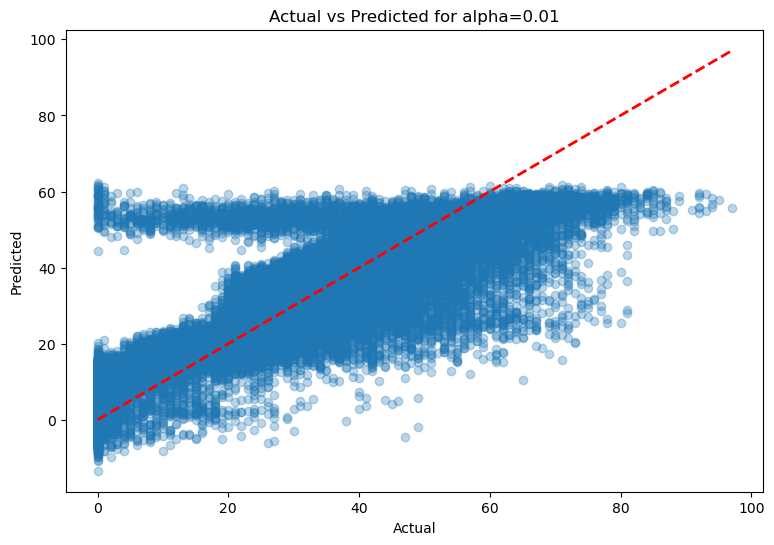

Training accuracy: 0.6861344867267849
Test accuracy: 0.6837315205396955
Mean Squared Error pour alpha=0.1: 143.62059218156705


/tmp/ipykernel_267905/3106141372.py:24: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y2_test.min(), y2_test.max()], [y2_test.min(), y2_test.max()], 'k--', lw=2, color='r')


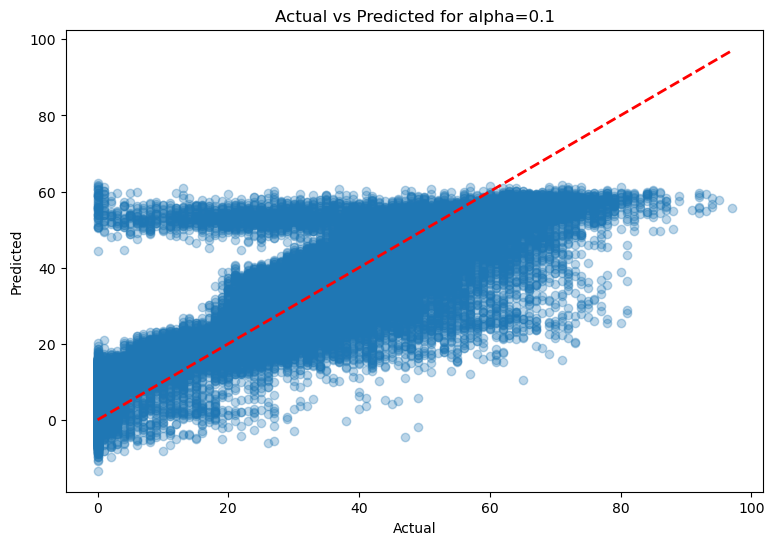

Training accuracy: 0.6861344347927492
Test accuracy: 0.683732470631919
Mean Squared Error pour alpha=1: 143.62016073544885


/tmp/ipykernel_267905/3106141372.py:24: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y2_test.min(), y2_test.max()], [y2_test.min(), y2_test.max()], 'k--', lw=2, color='r')


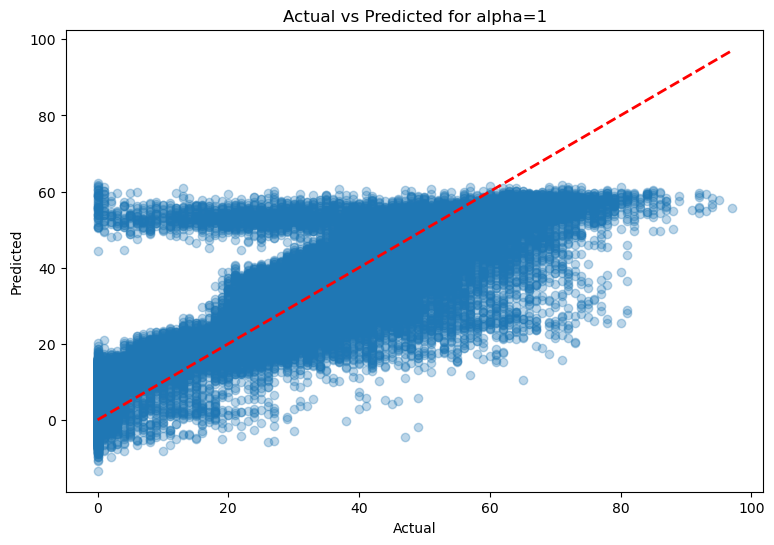

Training accuracy: 0.6861301107046228
Test accuracy: 0.683737081347512
Mean Squared Error pour alpha=10: 143.61806696465965


/tmp/ipykernel_267905/3106141372.py:24: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y2_test.min(), y2_test.max()], [y2_test.min(), y2_test.max()], 'k--', lw=2, color='r')


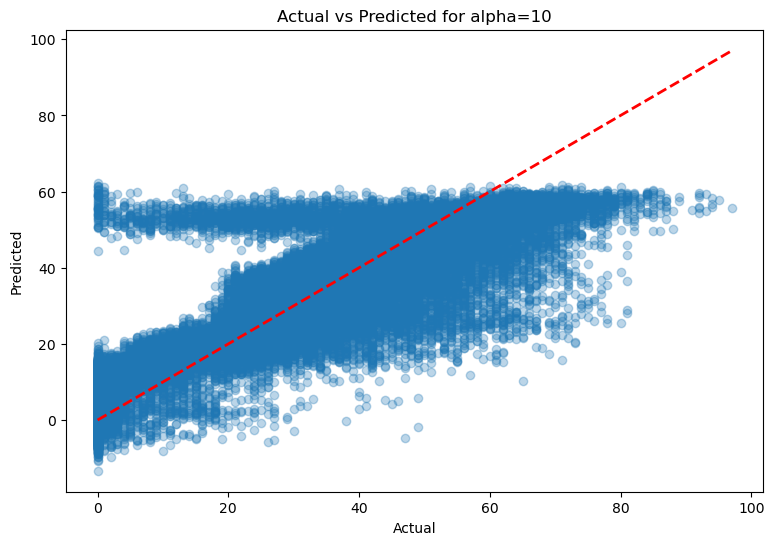

Training accuracy: 0.6859340809515118
Test accuracy: 0.683586604423901
Mean Squared Error pour alpha=100: 143.6863999990346


/tmp/ipykernel_267905/3106141372.py:24: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y2_test.min(), y2_test.max()], [y2_test.min(), y2_test.max()], 'k--', lw=2, color='r')


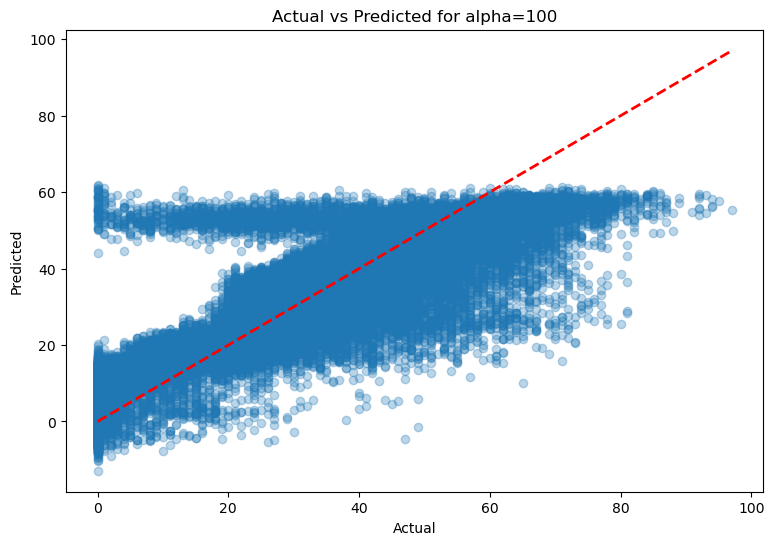

Training accuracy: 0.6774269483196125
Test accuracy: 0.6751575424199612
Mean Squared Error pour alpha=1000: 147.51411902625728


/tmp/ipykernel_267905/3106141372.py:24: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y2_test.min(), y2_test.max()], [y2_test.min(), y2_test.max()], 'k--', lw=2, color='r')


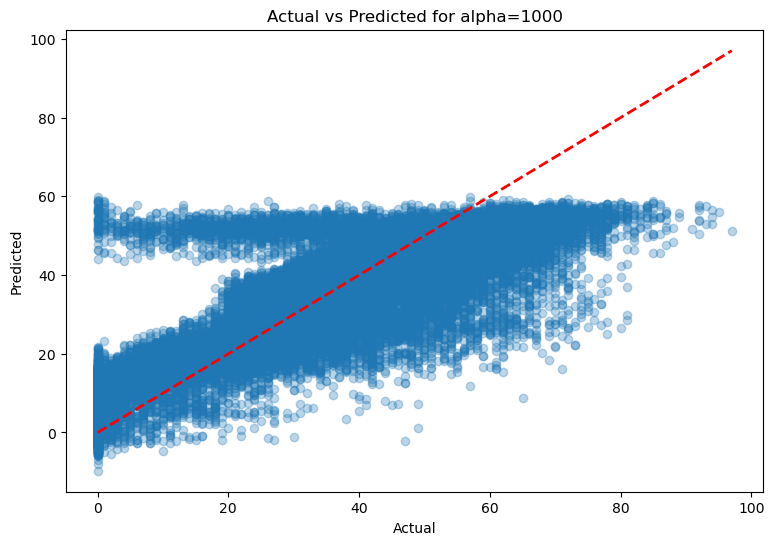

In [207]:
alphas = [0.001, 0.01, 0.1, 1, 10, 100, 1000]

for alpha in alphas:
    ridge = Ridge(alpha=alpha)

    ridge.fit(X2_train, y2_train)

    y2_pred = ridge.predict(X2_test)

    mse = mean_squared_error(y2_test, y2_pred)

    R_2_train = ridge.score(X2_train, y2_train)
    print(f"Le R2 du train: {R_2_train}")

    R_2_test = ridge.score(X2_test, y2_test)
    print(f"Le R2 du test: {R_2_test}")
    print(f"Mean Squared Error pour alpha={alpha}: {mse}")

    plt.figure(figsize=(9,6))
    plt.scatter(y2_test, y2_pred, alpha=0.3)
    plt.plot([y2_test.min(), y2_test.max()], [y2_test.min(), y2_test.max()], 'k--', lw=2, color='r')
    plt.xlabel('Actual')
    plt.ylabel('Predicted')
    plt.title(f'Actual vs Predicted for alpha={alpha}')
    plt.show()

In [106]:
# Initialize the Random Forest Regressor
rf = RandomForestRegressor(n_estimators=100, random_state=42)

# Fit the model on the training data
rf.fit(X2_train, y2_train)

# Make predictions on the test data
y2_pred = rf.predict(X2_test)

# Calculate the mean squared error of the predictions
mse = mean_squared_error(y2_test, y2_pred)

R_2_train = rf.score(X2_train, y2_train)
print(f"Le R2 du train: {R_2_train}")

R_2_test = rf.score(X2_test, y2_test)
print(f"Le R2 du test: {R_2_test}")
print(f"Mean Squared Error pour alpha={alpha}: {mse}")


NameError: name 'X2_train' is not defined

In [195]:
from sklearn.linear_model import LogisticRegression

model = LogisticRegression()
model.fit(X2_train, y2_train)

/opt/mamba/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [196]:
y2_pred = model.predict(X2_test)
mse = mean_squared_error(y2_test, y2_pred)


R_2_train = rf.score(X2_train, y2_train)
print(f"Le R2 du train: {R_2_train}")

R_2_test = rf.score(X2_test, y2_test)
print(f"Le R2 du test: {R_2_test}")
print(f"Mean Squared Error pour alpha={alpha}: {mse}")




Mean Squared Error: 622.3952280618453


Mean Squared Error: 148.5616552045241
R-squared: 0.6692726182272195


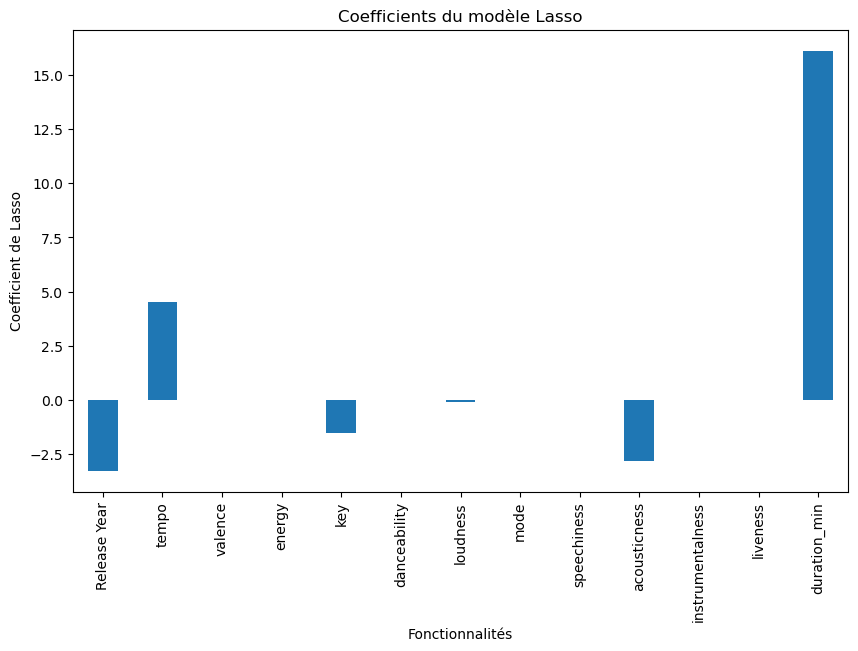

Release Year        -3.270528
tempo                4.528940
valence              0.000000
energy              -0.000000
key                 -1.506030
danceability         0.002811
loudness            -0.083183
mode                -0.000000
speechiness         -0.000000
acousticness        -2.802103
instrumentalness     0.002460
liveness             0.000000
duration_min        16.121443
dtype: float64


In [144]:
from sklearn.linear_model import Lasso
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import LassoCV

features = ['Release Year','tempo','valence','energy','key','danceability', 'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness','liveness', 'duration_min']

lasso_cv = LassoCV(cv=10)  
lasso_cv.fit(X2_train, y2_train)
best_alpha = lasso_cv.alpha_
alpha = best_alpha   
lasso_model = Lasso(alpha=alpha)
lasso_model.fit(X2_train, y2_train)
y2_pred = lasso_model.predict(X2_test)
mse = mean_squared_error(y2_test, y2_pred)
r2 = r2_score(y2_test, y2_pred)
print(f'Mean Squared Error: {mse}')
print(f'R-squared: {r2}')

# Afficher les coefficients du modèle
coefficients = pd.Series(lasso_model.coef_,index=features)
plt.figure(figsize=(10, 6))
coefficients.plot(kind='bar')
plt.title("Coefficients du modèle Lasso")
plt.xlabel("Fonctionnalités")
plt.ylabel("Coefficient de Lasso")
plt.show()
coefficients = pd.Series(lasso_model.coef_, index=features)
print(coefficients)